In [7]:
# Ran with predictors_simple kernel
# Python 3.10.8

import numpy as np # 1.26.4
import pandas as pd # 2.2.3
import tensorflow as tf # 2.10.0
import matplotlib # 3.10.3
import torch # 2.0.0

matplotlib.rcParams['figure.dpi'] = 100
matplotlib.rcParams['font.sans-serif'] = 'Arial'
from matplotlib import pyplot as plt

from joblib import load
from scipy.stats import spearmanr, pearsonr
from sklearn.metrics import precision_recall_curve, roc_curve
from sklearn.metrics import auc
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
import seaborn as sns
from sklearn.metrics.pairwise import cosine_similarity
import re

import os
from tqdm import tqdm 

from analysis_functions import get_best_model, make_row_plot, get_linear_weights, get_conv_weights, load_act_model, load_two_state_model, make_row_plot_abund


os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction/Model")
from ADModel_act import ADModel_act
from ADModel_abund import ADModel_abund
from ADModel_three_state import ADModel_three_state_abund
from ADModel_two_state import ADModel_two_state_abund
from Data import DataReader, SplitData, FastTensorDataLoader, one_hot_encode


os.chdir("/Users/claireleblanc/Documents/tools_software/adhunter")
from actpred.models import ActCNNSystem

# Set Numpy to display floats with 3 decimal places
np.set_printoptions(formatter={'float': lambda x: "{0:0.3f}".format(x)})

os.chdir("/Users/claireleblanc/Documents/grad_school/staller_lab/NN_interpretability_for_AD_prediction")

In [2]:
# Parameters to make figures work better with illustrator 
import matplotlib 
# For higher resoltion figures
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams["font.family"] = "Helvetica"
plt.rcParams['pdf.fonttype'] = 42

In [3]:
model_results = pd.read_csv('results/results_three_state_abund_test_leakyrelu.csv')
model_results['seed'] = [int(re.search("seed(\d+)", model.removeprefix("../../"))[1]) for model in  model_results["model_name"]]
model_results['abund_k'] = [int(re.search("ak(\d+)", model.removeprefix("../../"))[1]) for model in  model_results["model_name"]]
# model_results = model_results[model_results['abund_k'] == 30]
model_results = model_results[(model_results['activity_fun'] == "Hill") & (model_results['hill_value'] == 1) & (model_results['negative_pen'] == 0.5)].drop_duplicates()

bootstrap_results = pd.read_csv('results/results_three_state_bootstraps_leakyrelu.csv')
bootstrap_results = bootstrap_results[bootstrap_results['activity_fun'] == "Hill"]
bootstrap_results['bootstrap_number'] = [int(re.search("BOOTSTRAP_(\d+)", model.removeprefix("../../"))[1]) for model in  bootstrap_results["model_name"]]
bootstrap_results['seed'] = [int(re.search("seed(\d+)", model.removeprefix("../../"))[1]) for model in  bootstrap_results["model_name"]]
bootstrap_results['abund_k'] = [int(re.search("ak(\d+)", model.removeprefix("../../"))[1]) for model in  bootstrap_results["model_name"]]

In [8]:
# Running the two-state biophysical model on the data

# Biophysical model parameters
size = (1,40,20)
hill_value = 1
relu = False
# relu = True
outchannel = 1

# Function to read in weights
def load_model_get_weights(row, layer1='conv1.weight', layer2="linear1.weight", two_state=False, three_state=False, abund_k = False): 
    """
    Parameters
    ----------

    row : row of results data frame
    layer1 : name of convolutional layer
    layer2 : name of linear layer
    two_state : whether this is a simple or two state model (TO DO: ADD abundance)
    abund_k : if this is two state, whether we are reading in the abundance weights
    """

    model = row["model_name"].removeprefix("../../")
    kernel_size = row["kernel_size"]

    if three_state: 
        abund_k_two = row["abund_k"]
        activity_fun = row["activity_fun"]
        loaded_model = ADModel_three_state_abund(size,activity_fun, kernel_size, relu=relu, abund_k=abund_k_two)
    elif two_state: 
        abund_k_two = row["abund_k"]
        activity_fun = row["activity_fun"]
        loaded_model = ADModel_two_state_abund(size,activity_fun, kernel_size, relu=relu, abund_k=abund_k_two)
    else: 
        loaded_model = ADModel_abund(size, kernel_size)
    loaded_model.load_state_dict(torch.load(f"{model}.pth"))

    loaded_model.eval()
    model_state_dict = loaded_model.state_dict()
    width = model_state_dict[layer1].shape[0] * model_state_dict[layer1].shape[2]
    conv_weight = model_state_dict[layer1].detach().numpy().reshape(width,20)

    if abund_k:
        linear_weights_size = (40 - abund_k_two + 1)
    else:
        linear_weights_size = (40 - kernel_size + 1)
    linear_weights = model_state_dict[layer2].detach().numpy().reshape(linear_weights_size)

    return loaded_model, conv_weight, linear_weights

def get_weights_array(results_table, k_size, num_bootstraps=25, num_seeds=30, two_state=False, three_state=False, layer1=None, layer2=None, abund_k=False):
    """
    After we read in our weights, we want to store them in a numpy array where:
    - first dimension = number of shuffles
    - second dimension = number of seeds
    - third/fourth dimension = shape of the weights
    """

    # Defining our table of interest: If we want to look at the abundance weights
    if abund_k:
        index_col = 'abund_k'
    else:
        index_col = 'kernel_size'
    results_table = results_table[results_table[index_col] == k_size].copy()
    
    # Creating arrays to save weights
    conv_weight_arr = np.zeros((num_bootstraps, num_seeds, k_size, 20))
    linear_weight_arr = np.zeros((num_bootstraps, num_seeds, (40 - k_size + 1)))

    # If there is more than one bootstrap (i.e. not real weights), sort by bootstrap number and seed
    # Else sort by seeds
    if num_bootstraps > 1:
        results_table = results_table.sort_values(["seed", "bootstrap_number"]).reset_index()
        seeds_dict = {s : {a : i} for i, (s, a) in enumerate(results_table[['seed', 'abund_k']].drop_duplicates().values)}
    else:
        results_table = results_table.sort_values("seed").reset_index()

        # Assign an index to each seed
        # THIS IS NOT WORKING 
        seeds_dict = {}
        for i, (s, a) in enumerate(zip(results_table['seed'], results_table['abund_k'])): 
            if s in seeds_dict.keys():
                curr_dict = seeds_dict[s]
                if a in curr_dict.keys():
                    print(curr_dict)
                    print(a, i)
                    print("Uh oh")
                else: 
                    curr_dict[a] = i
            else:
                seeds_dict[s] = {a : i}

    # Loop through every model in the table of the correct size
    for index in tqdm(results_table.index):

        # Get correct row
        row = results_table.loc[index]
        
        # Check if there is a bootstrap column
        if num_bootstraps > 1:    
            shuffle_number = row['bootstrap_number']
        else:
            shuffle_number = 1
        
        if shuffle_number > num_bootstraps:
            print("here")
            break

        # Get seed index
        seed_index = seeds_dict[row['seed']][row['abund_k']]
        
        # Default to conv1 and linear1
        if (layer1 == None) and (layer2 == None):
            _, weights, linear_weights = load_model_get_weights(row, two_state=two_state, three_state=three_state)

        # Can pass specific layers
        else:
            _, weights, linear_weights = load_model_get_weights(row, layer1, layer2, two_state=two_state, three_state=three_state, abund_k=abund_k)

        # Save in the correct array 
        # First dim : bootstrap
        # Second dim : Seed
        # Third/fourth dim : Weights
        conv_weight_arr[shuffle_number -1, seed_index, :, :] = weights #.reshape(100, )
        linear_weight_arr[shuffle_number - 1, seed_index, :] = linear_weights

    return conv_weight_arr, linear_weight_arr

# Need to define our test statistics

# A. Cosine similarity between weights
# def cosine_similarity(shuffled_conv_arr, real_conv_arr, real_linear_arr):
#     num_shuffles, num_seeds, kernel_size, aa_nums = shuffled_conv_arr.shape
#     # aa_num = 1

#     num_iterations = int(num_seeds * (num_seeds-1) / 2)
#     shuffle_cos_similarities = np.zeros((num_shuffles, num_iterations, aa_nums))
    

#     for aa in range(aa_nums): 
#         for shuffle_num in range(num_shuffles):
#             a = 0
#             for i in range(num_seeds - 1):
#                 for j in range(i+1, num_seeds):
#                     vector1 = shuffled_conv_arr[shuffle_num, i, :, aa]#.flatten()
#                     vector2 = shuffled_conv_arr[shuffle_num, j, :, aa]#.flatten()
                    
#                     sim = np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))  
#                     shuffle_cos_similarities[shuffle_num, a, aa] = sim
#                     a += 1


#     similarities_real = np.zeros((1, 435, aa_nums))

#     # Which seeds had negative weights
#     neg_weight_filter = (real_linear_arr > 0).all(axis=2)

#     # Options: Flip sign or analyze separately
#     real_conv_arr_flipped = real_conv_arr.copy()
#     real_conv_arr_flipped[~ neg_weight_filter, :, :] = -1 * real_conv_arr_flipped[~ neg_weight_filter, :, :]

#     for aa in range(aa_nums): 
#         a=0
#         for i in range(num_seeds - 1):
#             for j in range(i+1, num_seeds):
#                 vector1 = real_conv_arr_flipped[0, i, :, aa] #.flatten()
#                 vector2 = real_conv_arr_flipped[0, j, :, aa] #.flatten()
                
#                 sim = np.dot(vector1, vector2) / (np.linalg.norm(vector1) * np.linalg.norm(vector2))  
#                 similarities_real[0, a, aa] = sim
#                 a+=1
        
#     return shuffle_cos_similarities, similarities_real


# B. Sum of weights
def weight_sum(shuffled_conv_arr, real_conv_arr, real_linear_arr):
    num_shuffles, num_seeds, kernel_size, aa_nums = shuffled_conv_arr.shape
    # aa_num = 1

    shuffled_row_sums = shuffled_conv_arr[:, :, :, :].sum(axis=2)

    # Which seeds had negative weights
    neg_weight_filter = (real_linear_arr > 0).all(axis=2)
    print(neg_weight_filter)

    # Options: Flip sign or analyze separately
    real_conv_arr_flipped = real_conv_arr.copy()
    real_conv_arr_flipped[~ neg_weight_filter, :, :] = -1 * real_conv_arr_flipped[~ neg_weight_filter, :, :]
    shuffled_real_sums = real_conv_arr_flipped[:, :, :, :].sum(axis=2)

    return shuffled_row_sums, shuffled_real_sums

# PLOTTING FUNCTIONS
colors = [(1, 0, 0), (1, 1, 1), (0, 0, 1)]  # Blue, White, Red
n_bins = 100  # Number of color bins
cmap_name = "custom_colormap"
custom_cmap = LinearSegmentedColormap.from_list(cmap_name, colors, N=n_bins)
custom_cmap.set_bad(color='white', alpha=1.0)  # Handle NaN values, if any

# Looking at the weight sums for K=5 --> Repeat for all convolutional filters
colors = {'A': 'purple', 'C': 'darkorange', 'E': 'blue', 'D': 'blue', 'G': 'darkorange', 
                  'F': 'indigo', 'I': 'purple', 'H': 'green', 'K': 'green', 'M': 'purple', 
                  'L': 'purple', 'N': 'darkslategray', 'Q': 'darkslategray', 'P': 'darkorange', 'S': 'darkslategray', 
                  'R': 'green', 'T': 'darkslategray', 'W': 'indigo', 'V': 'purple', 'Y': 'indigo'}


def boxplot_linear_weights(seed_linear_arr, bootstrap_linear_arr):
    fig, ax = plt.subplots(figsize=(5, 2.5))

    # For varried seed
    bplot1 = ax.boxplot(seed_linear_arr[0],
                        widths=0.3,
                        positions=np.arange(0.85, bootstrap_linear_arr.shape[-1] + .85, 1),
                        patch_artist=True, 
                        boxprops=dict(facecolor='orange', color='orange'), 
                        flierprops=dict(markersize=2, marker='.'),
                        medianprops=dict(color='black'), 
                        label="")

    # For varried 
    bplot2 = ax.boxplot(bootstrap_linear_arr[:, 0], 
                        widths=0.3,
                        positions=np.arange(1.15, bootstrap_linear_arr.shape[-1] + 1.15, 1), 
                        patch_artist=True, 
                        boxprops=dict(facecolor='teal', color='teal'), 
                        flierprops=dict(markersize=2, marker='.'), 
                        medianprops=dict(color='black')
                        )

    ax.set_ylabel("Linear weight")
    ax.hlines(0, 0.5, 1.5, color='black', linestyles='--')

    ax.set_xticks(np.arange(1, bootstrap_linear_arr.shape[-1] + 1, 2), np.arange(1, bootstrap_linear_arr.shape[-1] + 1, 2))

    sns.despine()

def boxplot_conv_weights(seed_test_stat_arr, bootstrap_test_stat_arr):

    fig, ax = plt.subplots(figsize=(5, 2.5))

    means = np.mean(seed_test_stat_arr, axis=1)
    sorted_indicies = np.argsort(means)[0]

    # For varried seed
    bplot1 = ax.boxplot(seed_test_stat_arr.squeeze(0)[:, sorted_indicies],
                        patch_artist=True, 
                        boxprops=dict(facecolor='orange', color='orange'), 
                        flierprops=dict(markersize=2, marker='.'),
                        medianprops=dict(color='black'))

    # For varried 
    bplot2 = ax.boxplot(bootstrap_test_stat_arr.squeeze(1)[:, sorted_indicies], 
                positions=np.arange(1.5, 21.5, 1), 
                patch_artist=True, 
                boxprops=dict(facecolor='teal', color='teal'), 
                flierprops=dict(markersize=2, marker='.'), 
                medianprops=dict(color='black')
                )

    new_order = [aa_order[i] for i in sorted_indicies]
    ax.set_xticks(range(1, 21), new_order)

    for xtic in ax.get_xticklabels():
        if xtic.get_text() in colors.keys(): 
            xtic.set_color(colors[xtic.get_text()])

    ax.set_ylabel("Convolutional filter weight sum")
    ax.hlines(0, 0.5, 20.5, color='black', linestyles='--')

    sns.despine()

def seed_conv_confidence_interval_plot(seed_conv_arr):
    low = np.percentile(seed_conv_arr, (100-95)/2, axis=1)
    median = np.mean(seed_conv_arr,axis=1)
    high = np.percentile(seed_conv_arr, 100- (100-95)/2, axis=1)

    mean = np.mean(seed_conv_arr,axis=1)
    variance = np.var(seed_conv_arr, axis=1)

    print(mean.shape, variance.shape)
    lim = 1
    fig, axs = plt.subplots(1, 3, figsize=(10, 10), sharey=True)
    im1 = axs[0].imshow(low.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    axs[1].imshow(median.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    axs[2].imshow(high.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)

    # im1 = axs[0].imshow((mean - variance).squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    # axs[1].imshow(mean.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    # axs[2].imshow((mean + variance).squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)

    axs[0].set_yticks(range(len(aa_order)), aa_order)  # Label x-axis with column names


    for ytic in axs[0].get_yticklabels():
        if ytic.get_text() in colors.keys(): 
            ytic.set_color(colors[ytic.get_text()])

    axs[0].tick_params(axis='x', which='major', labelsize=15) 
    axs[0].tick_params(axis='y', which='major', labelsize=15) 

    axs[1].tick_params(axis='x', which='major', labelsize=15)
    axs[2].tick_params(axis='x', which='major', labelsize=15)

    fig.colorbar(im1, ax=axs, location='bottom')

def bootstrap_conv_confidence_interval_plot(boostrap_conv_arr):
    low = np.percentile(boostrap_conv_arr, (100-95)/2, axis=0)
    mean = np.mean(boostrap_conv_arr,axis=0)
    high = np.percentile(boostrap_conv_arr, 100- (100-95)/2, axis=0)

    lim = 1
    fig, axs = plt.subplots(1, 3, figsize=(10, 10), sharey=True)
    im1 = axs[0].imshow(low.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    axs[1].imshow(mean.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    axs[2].imshow(high.squeeze(0).T, cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)

    axs[0].set_yticks(range(len(aa_order)), aa_order)  # Label x-axis with column names


    for ytic in axs[0].get_yticklabels():
        if ytic.get_text() in colors.keys(): 
            ytic.set_color(colors[ytic.get_text()])

    axs[0].tick_params(axis='x', which='major', labelsize=15) 
    axs[0].tick_params(axis='y', which='major', labelsize=15) 

    axs[1].tick_params(axis='x', which='major', labelsize=15)
    axs[2].tick_params(axis='x', which='major', labelsize=15)

    fig.colorbar(im1, ax=axs, location='bottom')




In [5]:
def run_analysis(k, seed=None, outfile_name = ""):
    seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
    seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

    if seed is not None: 
        boostrap_conv1_arr, bootstrap_linear1_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == seed], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
        boostrap_conv2_arr, bootstrap_linear2_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == seed], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')
    else:
        boostrap_conv1_arr, bootstrap_linear1_arr = get_weights_array(bootstrap_results, k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
        boostrap_conv2_arr, bootstrap_linear2_arr = get_weights_array(bootstrap_results, k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

    # Saving K1 weights
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_conv1_arr.npy", boostrap_conv1_arr)
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_linear1_arr.npy", bootstrap_linear1_arr)

    # Saving K2 weights
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_conv2_arr.npy", boostrap_conv2_arr)
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_linear2_arr.npy", bootstrap_linear2_arr)

    # Calculating test stat array for K1
    bootstrap1_test_stat_arr = boostrap_conv1_arr.sum(axis=2) 
    seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

    # Calculating test stat array for K2
    bootstrap2_test_stat_arr = boostrap_conv2_arr.sum(axis=2) 
    seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

    # Mean variance for K1
    print("Bootstrap conv1 variance", np.var(boostrap_conv1_arr, axis=0).mean())
    print("Seed conv1 variance", np.var(seed_conv1_arr, axis=1).mean())

    # Mean variance for K2
    print("Bootstrap conv2 variance", np.var(boostrap_conv2_arr, axis=0).mean())
    print("Seed conv2 variance", np.var(seed_conv2_arr, axis=1).mean())

    # PLOTTING THE LINEAR WEIGHTS
    boxplot_linear_weights(seed_linear1_arr, bootstrap_linear1_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_linear1_weights.pdf", format='pdf', bbox_inches='tight')
    
    # Plotting boxplot for conv weight sum
    boxplot_conv_weights(seed1_test_stat_arr, bootstrap1_test_stat_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_conv1_weights.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    seed_conv_confidence_interval_plot(seed_conv1_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_seed_conv1_percentile.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    bootstrap_conv_confidence_interval_plot(boostrap_conv1_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_bootstrap_conv1_percentile.pdf", format='pdf', bbox_inches='tight')

    # PLOTTING THE LINEAR WEIGHTS
    boxplot_linear_weights(seed_linear2_arr, bootstrap_linear2_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_linear2_weights.pdf", format='pdf', bbox_inches='tight')
    
    # Plotting boxplot for conv weight sum
    boxplot_conv_weights(seed2_test_stat_arr, bootstrap2_test_stat_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_conv2_weights.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    seed_conv_confidence_interval_plot(seed_conv2_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_seed_conv2_percentile.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    bootstrap_conv_confidence_interval_plot(boostrap_conv2_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_bootstrap_conv2_percentile.pdf", format='pdf', bbox_inches='tight')


# Weight inconsistency

In [12]:
sorted_model_results = get_best_model(model_results, spearman_abund=True)
sorted_model_results

,index,model_name,model_type,kernel_size,activity_fun,negative_pen,weight_pen,hill_value,spearman_abund_test,spearman_act_test,...,abund_negative,relu,total_params,seed,abund_k,r1,sum_rank,max_rank,r2,r4
0,1030,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Hill,0.5,0.1,1,0.556835,0.796219,...,False,False,2031,5273682,20,78,92,78,4,10
1,1027,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,15,Hill,0.5,0.1,1,0.556835,0.786548,...,False,False,1081,5273682,20,40,94,43,43,11
2,1006,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Hill,0.5,0.1,1,0.558325,0.793678,...,False,False,2411,82376482,40,66,98,66,2,30
3,816,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Hill,0.5,0.1,1,0.563000,0.779810,...,False,False,1081,3297062,30,65,105,65,38,2
4,1072,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Hill,0.5,0.1,1,0.569457,0.796224,...,False,False,2221,1298091,30,44,130,83,3,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
355,726,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,10,Hill,0.5,0.1,1,0.534174,0.776722,...,True,False,701,830655019,10,339,922,350,350,233
356,789,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,30,Hill,0.5,0.1,1,0.548511,0.770995,...,True,False,2031,8923039,40,292,933,329,329,312
357,1012,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,40,Hill,0.5,0.1,1,0.518592,0.766584,...,True,False,1746,5273682,5,305,991,346,340,346
358,974,../../model_data/three_state_abundmodel_b10_e2...,three_state_abund,20,Hill,0.5,0.1,1,0.518811,0.781064,...,True,False,986,82376482,5,321,1003,348,334,348


In [ ]:
three_state_biophysical_model, _, _ = load_model_get_weights(sorted_model_results.loc[0], three_state=True)
kernel_size_three = sorted_model_results.loc[0, 'kernel_size']
abund_k_three = sorted_model_results.loc[0, 'abund_k']

In [25]:
def make_row_plot_abund(fig, kernel_size, model, row, lim, height_ratios, num_rows, abund_kernel_size):
    """
    Core functionality for creating the convolutional filter plots. 
    Plots the convolution filter as a heatmap and the linear weights as a bar plot.

    Parameters
    ----------
    fig : matplotlib.figure.Figure
        Figure object created with plt.figure
    
    kernel_size : int
        The size of the convolutional filter

    model : ADModel_abund
        Loaded model (from which parameters will be extracted)
    
    row : int
        Which row in the overall figure should we fill in

    lim : float
        The max value for the heatmap

    height_ratios : list
        Ratio of heights between rows, length should correspond to number of rows in
        gridspec object

    num_rows : list
        The number of rows in the gridspec object
    
    abund_kernel_size : int
        The size of the abundance kernel (can be different from other kernel sizes)

    Returns
    -------
    ax1-6 : maplotlib.Axes object
        Contains the heatmaps and barplots
    im1-3 : maplotlib.Axes.imshow object
        The heatmaps
    """

    # Load the parameters for the K1 module
    model_conv1 = get_conv_weights(model, "conv1.weight").T
    model_linear1, model_xvals1 = get_linear_weights(model, "linear1.weight", kernel_size)

    # Load the parameters for the K2 module
    model_conv2 = get_conv_weights(model, "conv2.weight").T
    model_linear2, model_xvals2 = get_linear_weights(model, "linear2.weight", kernel_size)

    # Load the parameters for the abundance module
    model_conv3 = get_conv_weights(model, "conv3.weight").T
    model_linear3, model_xvals3 = get_linear_weights(model, "linear3.weight", abund_kernel_size)

    # Calculate how much of the figure the convolutional filter vs. linear weights will take up
    ratio1 = kernel_size 
    ratio2 = 40 - kernel_size + 1
    ratio1_abund = abund_kernel_size
    ratio2_abund = 40 - abund_kernel_size + 1

    # GridSpec allows us to plot rows/columns with different dimensions
    # Here, we initalize the gridspec object with the total number of rows in our figure
    # But we only fill in the specific row that we are interested in
    # (When combined with many other gridspec objects, they will all line up and look good)
    gs1 = gridspec.GridSpec(2 + num_rows, 8, width_ratios=[ratio1, ratio2, 0.5, ratio1, ratio2, 0.5, ratio1_abund, ratio2_abund], height_ratios=height_ratios, figure=fig)
    
    # Maplotlib axes
    ax1 = plt.subplot(gs1[row, 0])
    ax2 = plt.subplot(gs1[row, 1])
    ax3 = plt.subplot(gs1[row, 3])
    ax4 = plt.subplot(gs1[row, 4])
    ax5 = plt.subplot(gs1[row, 6])
    ax6 = plt.subplot(gs1[row, 7])

    # Plotting K1 heatmap
    im1 = ax1.imshow(model_conv1.to_numpy(), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    ax1.set_yticks(range(len(model_conv1.index)), model_conv1.index)  # Label x-axis with column names
    ax1.set_xticks(np.arange(kernel_size, step=2))

    # This is to color the amino acid labels
    for ytic in ax1.get_yticklabels():
        if ytic.get_text() in colors.keys(): 
            ytic.set_color(colors[ytic.get_text()])
    ax1.tick_params(axis='both', which='major', labelsize=6) 

    # Plotting K1 barplot
    ax2.bar(model_xvals1, model_linear1, color="grey")
    ax2.spines["top"].set_visible(False)
    ax2.spines["left"].set_visible(False)
    ax2.spines["right"].set_visible(False)
    ax2.spines["bottom"].set_position('zero')
    ax2.set_xticks([])
    ax2.set_yticks([])
    ax2.set_xticklabels([])
    ax2.set_yticklabels([])

    # Plotting K2 heatmap
    im2 = ax3.imshow(model_conv2.to_numpy(), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    ax3.set_yticks(range(len(model_conv2.index)), model_conv2.index)  # Label x-axis with column names
    ax3.set_xticks(np.arange(kernel_size, step=2))
    
    # Color the aa labels
    for ytic in ax3.get_yticklabels():
        if ytic.get_text() in colors.keys(): 
            ytic.set_color(colors[ytic.get_text()])
    ax3.tick_params(axis='both', which='major', labelsize=6) 

    # Plotting K2 bargraph
    ax4.bar(model_xvals2, model_linear2, color="grey")
    ax4.spines["top"].set_visible(False)
    ax4.spines["left"].set_visible(False)
    ax4.spines["right"].set_visible(False)
    ax4.spines["bottom"].set_position('zero')
    ax4.set_xticks([])
    ax4.set_yticks([])
    ax4.set_xticklabels([])
    ax4.set_yticklabels([])

    # Plotting abundance heatmap
    im3 = ax5.imshow(model_conv3.to_numpy(), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
    ax5.set_yticks(range(len(model_conv3.index)), model_conv3.index)  # Label x-axis with column names
    ax5.set_xticks(np.arange(abund_kernel_size, step=2))

    # Changing aa label color
    for ytic in ax5.get_yticklabels():
        if ytic.get_text() in colors.keys(): 
            ytic.set_color(colors[ytic.get_text()])
    ax5.tick_params(axis='both', which='major', labelsize=6) 

    # Plotting abundance bar graph
    ax6.bar(model_xvals3, model_linear3, color="grey")
    ax6.spines["top"].set_visible(False)
    ax6.spines["left"].set_visible(False)
    ax6.spines["right"].set_visible(False)
    ax6.spines["bottom"].set_position('zero')
    ax6.set_xticks([])
    ax6.set_yticks([])
    ax6.set_xticklabels([])
    ax6.set_yticklabels([])

    return ax1, ax2, ax3, ax4, ax5, ax6, im1, im2, im3

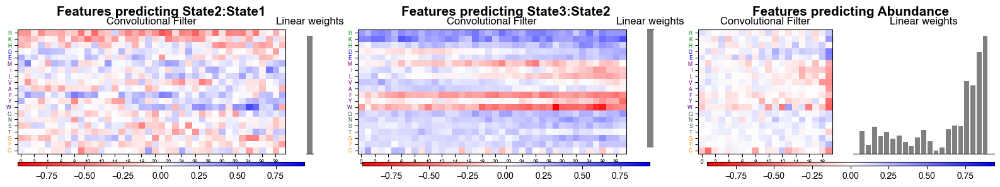

In [26]:
num_rows = 1

# Get the max value for the heatmaps
models = [three_state_biophysical_model]
conv_weights = []

for model in models: 
    conv_weights += list(get_conv_weights(model, "conv1.weight").T.values.flatten())
    conv_weights += list(get_conv_weights(model, "conv2.weight").T.values.flatten())

lim = max([abs(w) for w in conv_weights])

# Create a figure
fig = plt.figure(figsize=(20, 3*num_rows))
title_font = {'fontsize': 15, 'fontweight': 'bold', 'fontname': 'Arial'}

# We add in "padding" rows between the rows we care about
height_ratios = [.01] + [3.3]*num_rows + [.1]

# Create a gridspec object for the title 
gs1 = gridspec.GridSpec(2 + num_rows, 3, width_ratios=[1,1,1], height_ratios=height_ratios, figure=fig)

# Title for the K1 parameters
ax1 = plt.subplot(gs1[0,0])
ax1.set_title("Features predicting State2:State1", fontdict=title_font)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.patch.set_visible(False)
ax1.axis('off')

# Title for the K2 parameters
ax2 = plt.subplot(gs1[0,1])
ax2.set_title("Features predicting State3:State2", fontdict=title_font)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xticklabels([])
ax2.set_yticklabels([])
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.patch.set_visible(False)
ax2.axis('off')

# Title for the abundance parameters
ax3 = plt.subplot(gs1[0,2])
ax3.set_title("Features predicting Abundance", fontdict=title_font)
ax3.set_xticks([])
ax3.set_yticks([])
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['left'].set_visible(False)
ax3.spines['bottom'].set_visible(False)
ax3.patch.set_visible(False)
ax3.axis('off')

# Plot the parameters in a single row
ax1, ax2, ax3, ax4, ax5, ax6, im1, im2, im3 = make_row_plot_abund(fig, kernel_size_three, three_state_biophysical_model, 1, lim, height_ratios, num_rows, abund_k_three)

# Add titles
ax1.set_title("Convolutional Filter", fontsize=12)
ax2.set_title("Linear weights", fontsize=12)
ax3.set_title("Convolutional Filter", fontsize=12)
ax4.set_title("Linear weights", fontsize=12)
ax5.set_title("Convolutional Filter", fontsize=12)
ax6.set_title("Linear weights", fontsize=12)

# Create gridspec object for the colorbar
gs_cb = gridspec.GridSpec(2 + num_rows, 3, width_ratios=[1,1,1], height_ratios=height_ratios, figure=fig)
cax1 = plt.subplot(gs_cb[1 + num_rows,0])
cax2 = plt.subplot(gs_cb[1 + num_rows,1])
cax3 = plt.subplot(gs_cb[1 + num_rows,2])

# Add the colorbar
fig.colorbar(im1,cax=cax1, orientation='horizontal')
fig.colorbar(im2, cax=cax2, orientation='horizontal')
fig.colorbar(im3, cax=cax3, orientation='horizontal')

# plt.savefig('figures/for_revision/three_state_parameters.pdf', dpi=1000, bbox_inches='tight')

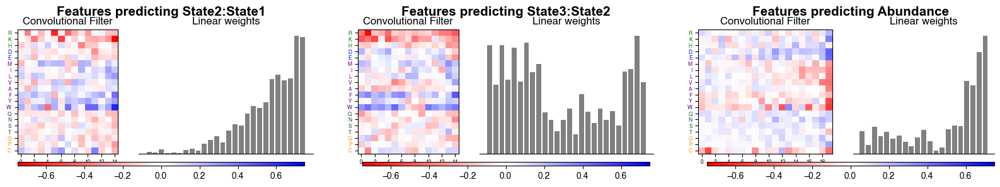

In [ ]:
three_state_biophysical_model, _, _ = load_model_get_weights(sorted_model_results.loc[1], three_state=True)
kernel_size_three = sorted_model_results.loc[1, 'kernel_size']
abund_k_three = sorted_model_results.loc[1, 'abund_k']

num_rows = 1

# Get the max value for the heatmaps
models = [three_state_biophysical_model]
conv_weights = []

for model in models: 
    conv_weights += list(get_conv_weights(model, "conv1.weight").T.values.flatten())
    conv_weights += list(get_conv_weights(model, "conv2.weight").T.values.flatten())

lim = max([abs(w) for w in conv_weights])

# Create a figure
fig = plt.figure(figsize=(20, 3*num_rows))
title_font = {'fontsize': 15, 'fontweight': 'bold', 'fontname': 'Arial'}

# We add in "padding" rows between the rows we care about
height_ratios = [.01] + [3.3]*num_rows + [.1]

# Create a gridspec object for the title 
gs1 = gridspec.GridSpec(2 + num_rows, 3, width_ratios=[1,1,1], height_ratios=height_ratios, figure=fig)

# Title for the K1 parameters
ax1 = plt.subplot(gs1[0,0])
ax1.set_title("Features predicting State2:State1", fontdict=title_font)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.patch.set_visible(False)
ax1.axis('off')

# Title for the K2 parameters
ax2 = plt.subplot(gs1[0,1])
ax2.set_title("Features predicting State3:State2", fontdict=title_font)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xticklabels([])
ax2.set_yticklabels([])
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.patch.set_visible(False)
ax2.axis('off')

# Title for the abundance parameters
ax3 = plt.subplot(gs1[0,2])
ax3.set_title("Features predicting Abundance", fontdict=title_font)
ax3.set_xticks([])
ax3.set_yticks([])
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['left'].set_visible(False)
ax3.spines['bottom'].set_visible(False)
ax3.patch.set_visible(False)
ax3.axis('off')

# Plot the parameters in a single row
ax1, ax2, ax3, ax4, ax5, ax6, im1, im2, im3 = make_row_plot_abund(fig, kernel_size_three, three_state_biophysical_model, 1, lim, height_ratios, num_rows, abund_k_three)

# Add titles
ax1.set_title("Convolutional Filter", fontsize=12)
ax2.set_title("Linear weights", fontsize=12)
ax3.set_title("Convolutional Filter", fontsize=12)
ax4.set_title("Linear weights", fontsize=12)
ax5.set_title("Convolutional Filter", fontsize=12)
ax6.set_title("Linear weights", fontsize=12)

# Create gridspec object for the colorbar
gs_cb = gridspec.GridSpec(2 + num_rows, 3, width_ratios=[1,1,1], height_ratios=height_ratios, figure=fig)
cax1 = plt.subplot(gs_cb[1 + num_rows,0])
cax2 = plt.subplot(gs_cb[1 + num_rows,1])
cax3 = plt.subplot(gs_cb[1 + num_rows,2])

# Add the colorbar
fig.colorbar(im1,cax=cax1, orientation='horizontal')
fig.colorbar(im2, cax=cax2, orientation='horizontal')
fig.colorbar(im3, cax=cax3, orientation='horizontal')

# plt.savefig('figures/for_revision/three_state_parameters.pdf', dpi=1000, bbox_inches='tight')

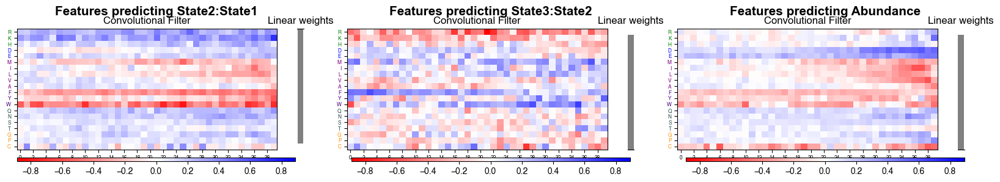

In [ ]:
i = 2
three_state_biophysical_model, _, _ = load_model_get_weights(sorted_model_results.loc[i], three_state=True)
kernel_size_three = sorted_model_results.loc[i, 'kernel_size']
abund_k_three = sorted_model_results.loc[i, 'abund_k']

num_rows = 1

# Get the max value for the heatmaps
models = [three_state_biophysical_model]
conv_weights = []

for model in models: 
    conv_weights += list(get_conv_weights(model, "conv1.weight").T.values.flatten())
    conv_weights += list(get_conv_weights(model, "conv2.weight").T.values.flatten())

lim = max([abs(w) for w in conv_weights])

# Create a figure
fig = plt.figure(figsize=(20, 3*num_rows))
title_font = {'fontsize': 15, 'fontweight': 'bold', 'fontname': 'Arial'}

# We add in "padding" rows between the rows we care about
height_ratios = [.01] + [3.3]*num_rows + [.1]

# Create a gridspec object for the title 
gs1 = gridspec.GridSpec(2 + num_rows, 3, width_ratios=[1,1,1], height_ratios=height_ratios, figure=fig)

# Title for the K1 parameters
ax1 = plt.subplot(gs1[0,0])
ax1.set_title("Features predicting State2:State1", fontdict=title_font)
ax1.set_xticks([])
ax1.set_yticks([])
ax1.set_xticklabels([])
ax1.set_yticklabels([])
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.spines['left'].set_visible(False)
ax1.spines['bottom'].set_visible(False)
ax1.patch.set_visible(False)
ax1.axis('off')

# Title for the K2 parameters
ax2 = plt.subplot(gs1[0,1])
ax2.set_title("Features predicting State3:State2", fontdict=title_font)
ax2.set_xticks([])
ax2.set_yticks([])
ax2.set_xticklabels([])
ax2.set_yticklabels([])
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.spines['bottom'].set_visible(False)
ax2.patch.set_visible(False)
ax2.axis('off')

# Title for the abundance parameters
ax3 = plt.subplot(gs1[0,2])
ax3.set_title("Features predicting Abundance", fontdict=title_font)
ax3.set_xticks([])
ax3.set_yticks([])
ax3.set_xticklabels([])
ax3.set_yticklabels([])
ax3.spines['top'].set_visible(False)
ax3.spines['right'].set_visible(False)
ax3.spines['left'].set_visible(False)
ax3.spines['bottom'].set_visible(False)
ax3.patch.set_visible(False)
ax3.axis('off')

# Plot the parameters in a single row
ax1, ax2, ax3, ax4, ax5, ax6, im1, im2, im3 = make_row_plot_abund(fig, kernel_size_three, three_state_biophysical_model, 1, lim, height_ratios, num_rows, abund_k_three)

# Add titles
ax1.set_title("Convolutional Filter", fontsize=12)
ax2.set_title("Linear weights", fontsize=12)
ax3.set_title("Convolutional Filter", fontsize=12)
ax4.set_title("Linear weights", fontsize=12)
ax5.set_title("Convolutional Filter", fontsize=12)
ax6.set_title("Linear weights", fontsize=12)

# Create gridspec object for the colorbar
gs_cb = gridspec.GridSpec(2 + num_rows, 3, width_ratios=[1,1,1], height_ratios=height_ratios, figure=fig)
cax1 = plt.subplot(gs_cb[1 + num_rows,0])
cax2 = plt.subplot(gs_cb[1 + num_rows,1])
cax3 = plt.subplot(gs_cb[1 + num_rows,2])

# Add the colorbar
fig.colorbar(im1,cax=cax1, orientation='horizontal')
fig.colorbar(im2, cax=cax2, orientation='horizontal')
fig.colorbar(im3, cax=cax3, orientation='horizontal')

# plt.savefig('figures/for_revision/three_state_parameters.pdf', dpi=1000, bbox_inches='tight')

In [51]:
# Two state

two_model_results = pd.read_csv('results/results_two_state_test_leakyrelu.csv')
two_model_results['seed'] = [int(re.search("seed(\d+)", model.removeprefix("../../"))[1]) for model in  two_model_results["model_name"]]
two_model_results['abund_k'] = [int(re.search("ak(\d+)", model.removeprefix("../../"))[1]) for model in  two_model_results["model_name"]]
# model_results = model_results[model_results['abund_k'] == 30]
two_model_results = two_model_results[(two_model_results['activity_fun'] == "Hill") & (two_model_results['hill_value'] == 1) & (two_model_results['negative_pen'] == 0.5)].drop_duplicates()


100%|██████████| 60/60 [00:00<00:00, 669.18it/s]


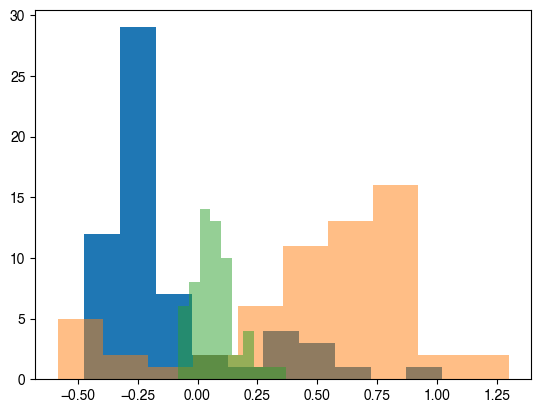

100%|██████████| 60/60 [00:00<00:00, 540.00it/s]


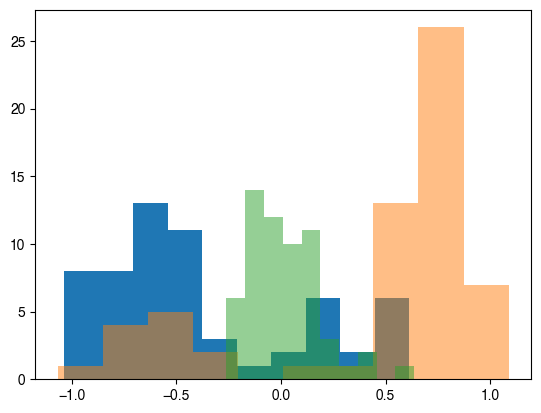

100%|██████████| 60/60 [00:00<00:00, 611.64it/s]


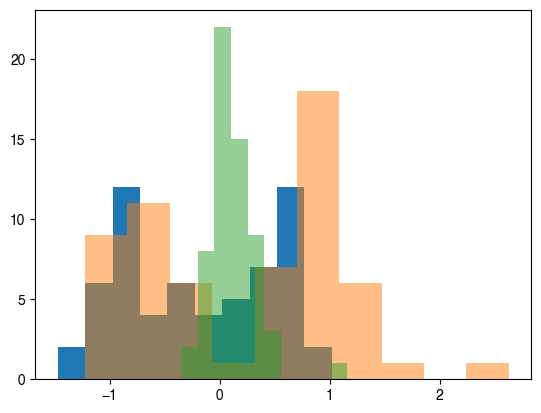

100%|██████████| 60/60 [00:41<00:00,  1.45it/s]


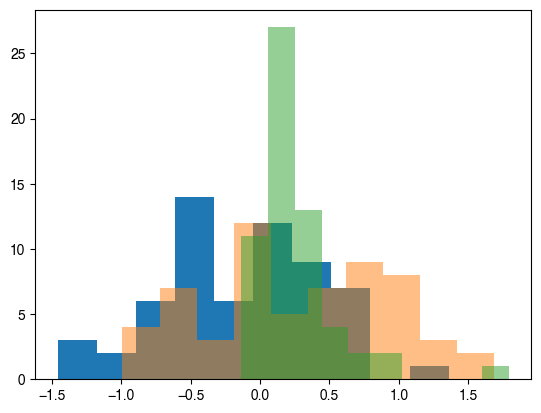

100%|██████████| 60/60 [00:55<00:00,  1.08it/s]


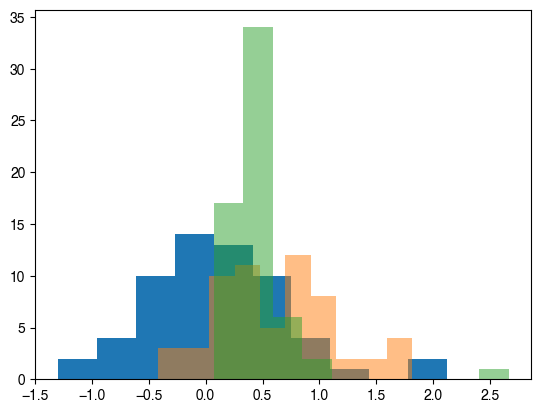

100%|██████████| 60/60 [00:46<00:00,  1.29it/s]


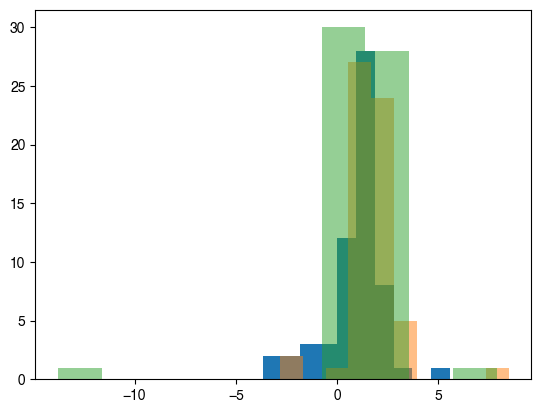

In [59]:
k = 5

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)
seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

plt.hist(seed1_test_stat_arr[0, :, 3])
plt.hist(seed2_test_stat_arr[0, :, 3], alpha=0.5)

two_seed_conv_arr, two_seed_linear_arr = get_weights_array(two_model_results, k_size=k, num_bootstraps=1, num_seeds=60, two_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
two_seed_test_stat_arr = two_seed_conv_arr.sum(axis=2)
plt.hist(two_seed_test_stat_arr[0, :, 3], alpha=0.5)

plt.show()

# Group 2
k = 10

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

# Calculating test stat array for K1
seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

# Calculating test stat array for K2
seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

plt.hist(seed1_test_stat_arr[0, :, 3])
plt.hist(seed2_test_stat_arr[0, :, 3], alpha=0.5)

two_seed_conv_arr, two_seed_linear_arr = get_weights_array(two_model_results, k_size=k, num_bootstraps=1, num_seeds=60, two_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
two_seed_test_stat_arr = two_seed_conv_arr.sum(axis=2)
plt.hist(two_seed_test_stat_arr[0, :, 3], alpha=0.5)
plt.show()


# Group 3
k = 15

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

plt.hist(seed1_test_stat_arr[0, :, 3])
plt.hist(seed2_test_stat_arr[0, :, 3], alpha=0.5)

two_seed_conv_arr, two_seed_linear_arr = get_weights_array(two_model_results, k_size=k, num_bootstraps=1, num_seeds=60, two_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
two_seed_test_stat_arr = two_seed_conv_arr.sum(axis=2)
plt.hist(two_seed_test_stat_arr[0, :, 3], alpha=0.5)
plt.show()

# K=20
k = 20

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

plt.hist(seed1_test_stat_arr[0, :, 3])
plt.hist(seed2_test_stat_arr[0, :, 3], alpha=0.5)

two_seed_conv_arr, two_seed_linear_arr = get_weights_array(two_model_results, k_size=k, num_bootstraps=1, num_seeds=60, two_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
two_seed_test_stat_arr = two_seed_conv_arr.sum(axis=2)
plt.hist(two_seed_test_stat_arr[0, :, 3], alpha=0.5)
plt.show()

# K=30
k = 30

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

plt.hist(seed1_test_stat_arr[0, :, 3])
plt.hist(seed2_test_stat_arr[0, :, 3], alpha=0.5)

two_seed_conv_arr, two_seed_linear_arr = get_weights_array(two_model_results, k_size=k, num_bootstraps=1, num_seeds=60, two_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
two_seed_test_stat_arr = two_seed_conv_arr.sum(axis=2)
plt.hist(two_seed_test_stat_arr[0, :, 3], alpha=0.5)
plt.show()

# K=40
k = 40

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

plt.hist(seed1_test_stat_arr[0, :, 3])
plt.hist(seed2_test_stat_arr[0, :, 3], alpha=0.5)

two_seed_conv_arr, two_seed_linear_arr = get_weights_array(two_model_results, k_size=k, num_bootstraps=1, num_seeds=60, two_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
two_seed_test_stat_arr = two_seed_conv_arr.sum(axis=2)
plt.hist(two_seed_test_stat_arr[0, :, 3], alpha=0.5)
plt.show()



In [38]:
aa_order= ["R","H","K","D","E","S","T","N","Q","C","G","P","A","V","I","L","M","F","Y","W"]
aa_order.index('D') #

3

# K = 5

100%|██████████| 200/200 [00:00<00:00, 469.95it/s]


Bootstrap conv1 variance 0.010063826450918903
Seed conv1 variance 0.022261764327975653
Bootstrap conv2 variance 0.01197889522276032
Seed conv2 variance 0.027878065499285974


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 5, 20) (1, 5, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 5, 20) (1, 5, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


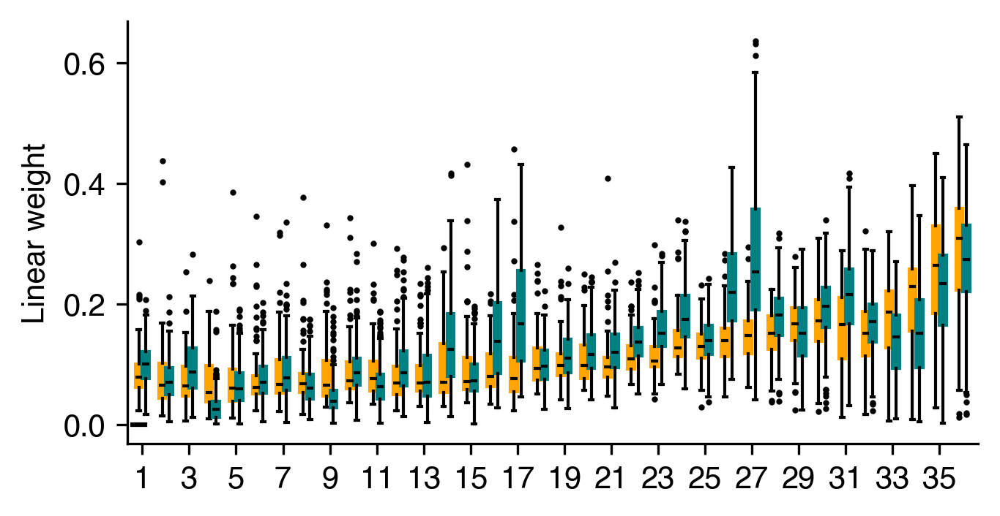

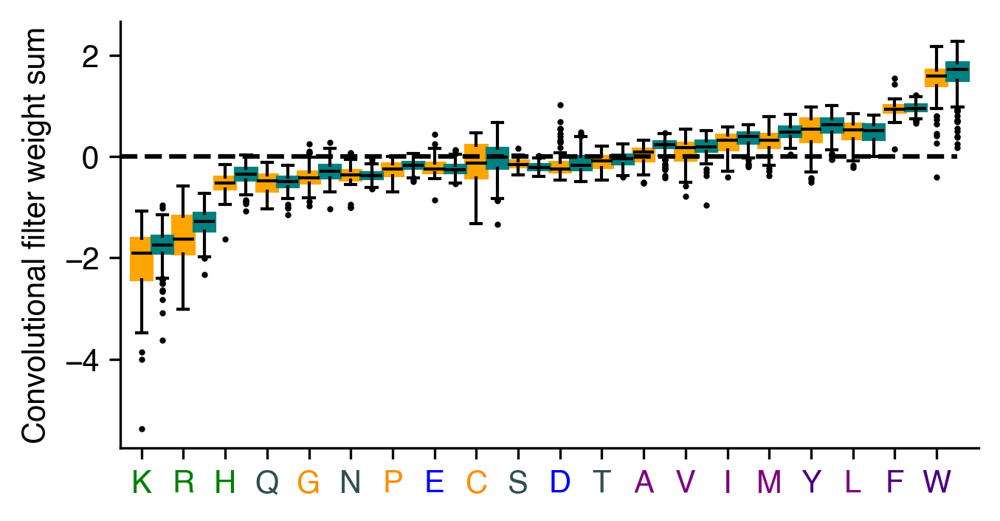

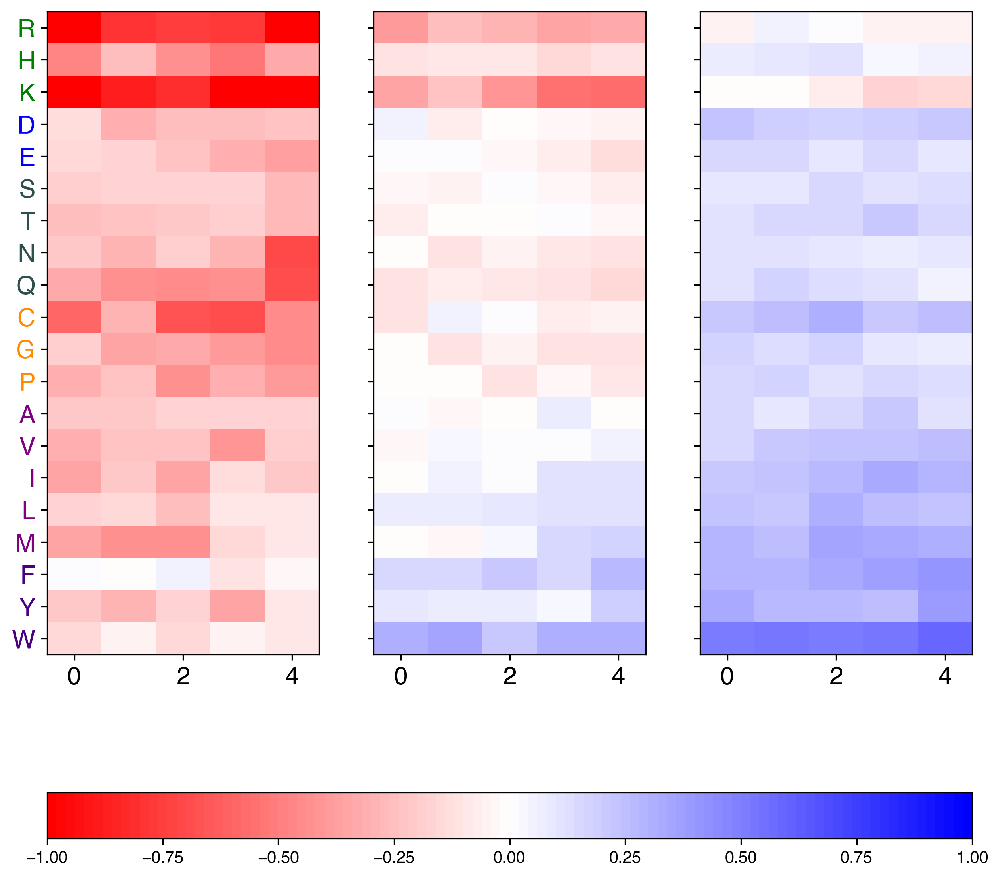

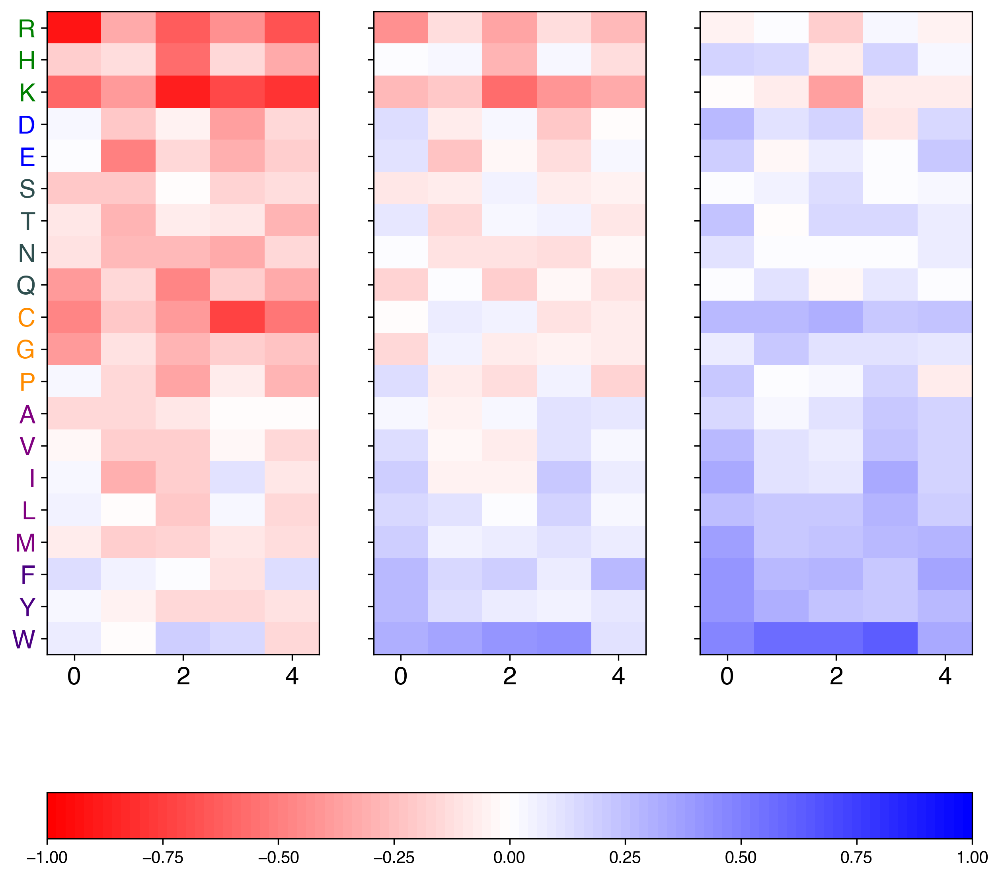

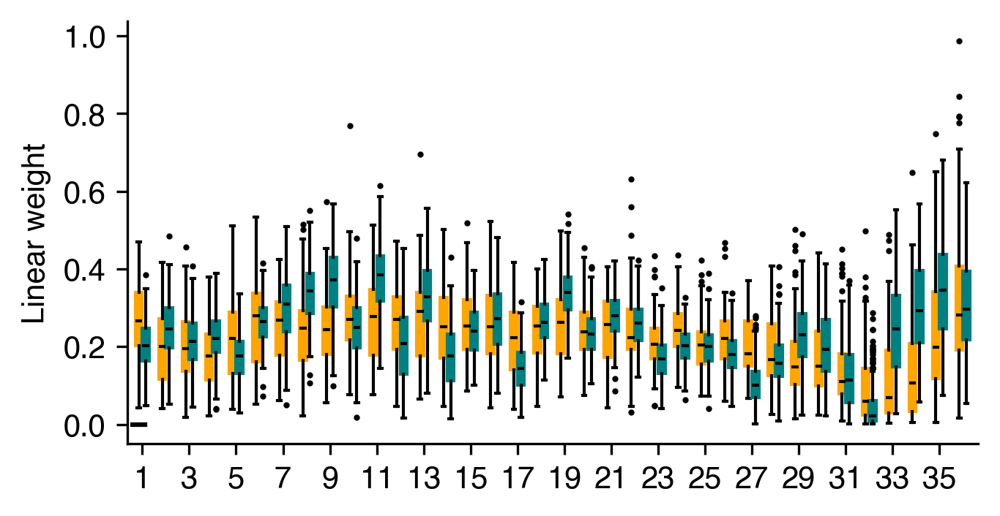

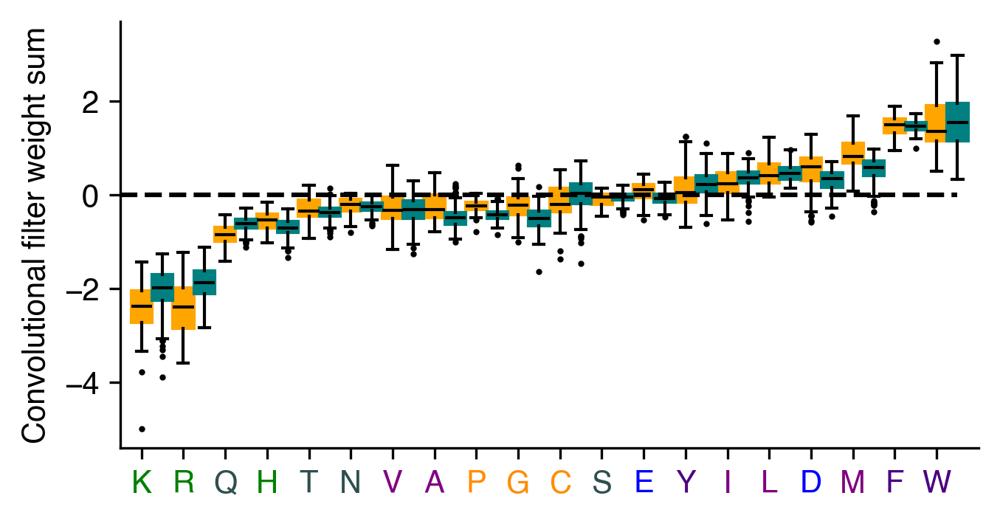

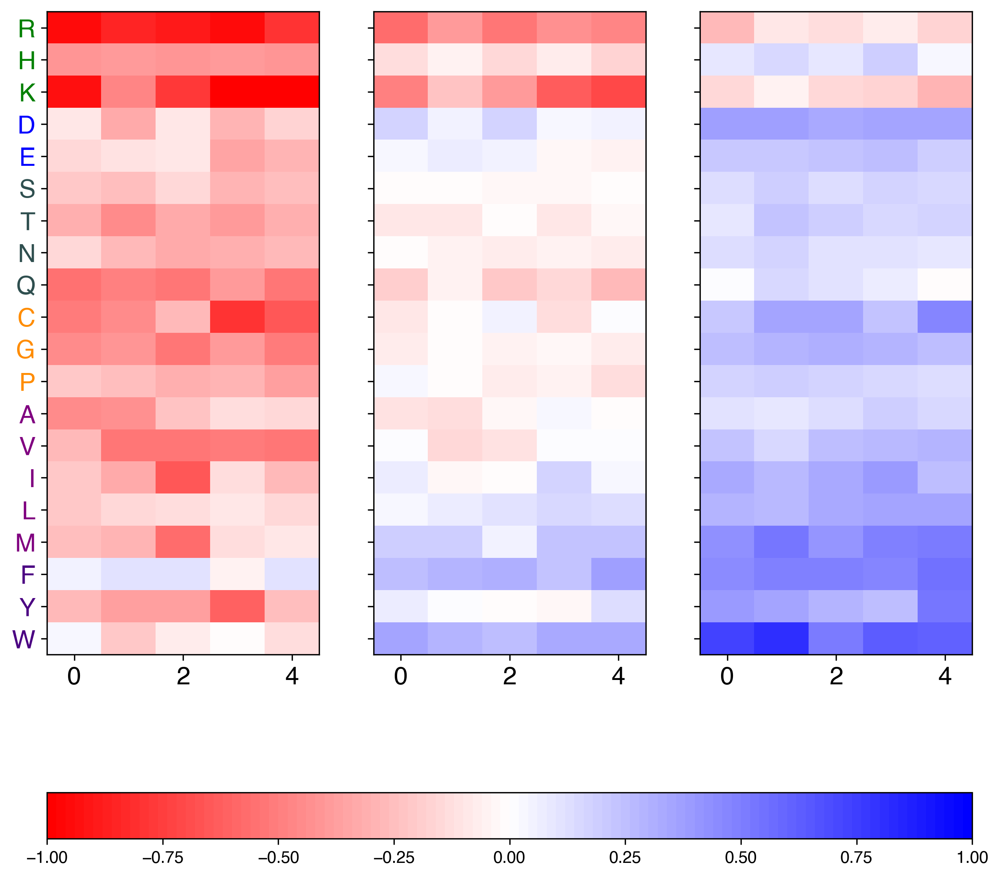

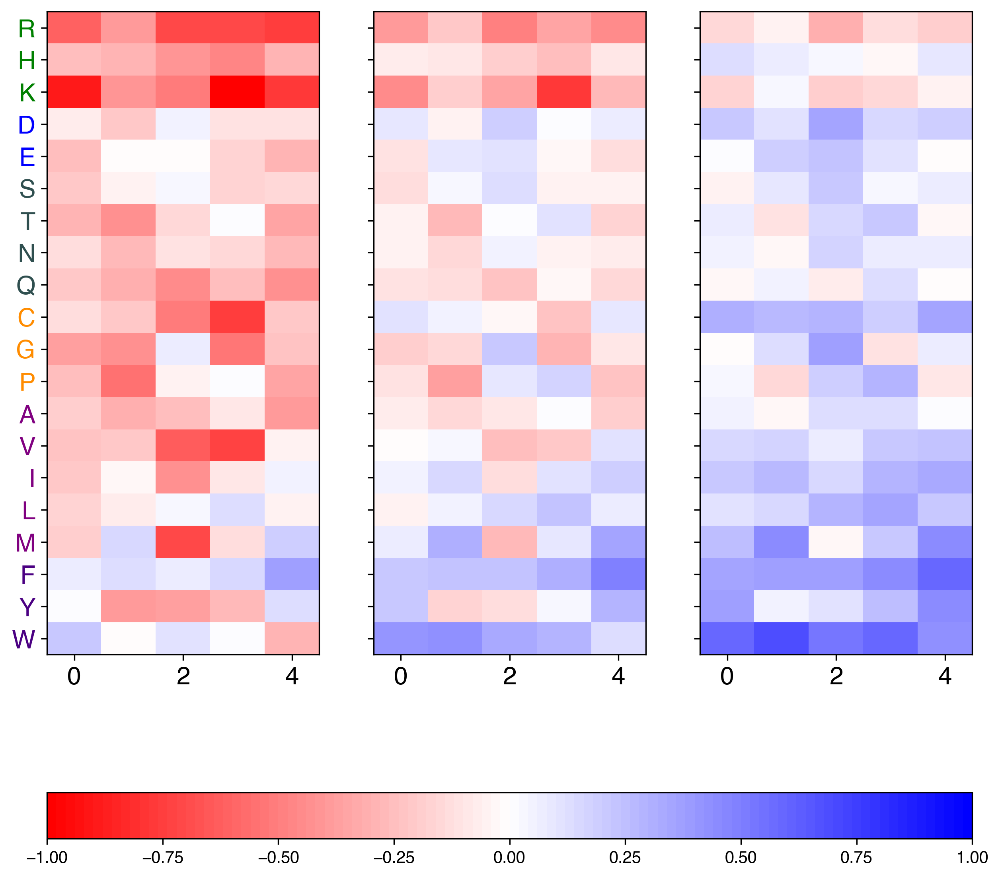

In [44]:
# comparison_subset
orig_aa_order = ["R","H","K","D","E","S","T","N","Q","C","G","P","A","V","I","L","M","F","Y","W"]
aa_order = ["R","H","K","D","E","S","T","N","Q","C","G","P","A","V","I","L","M","F","Y","W"]

run_analysis(5, outfile_name="k5")

# K = 10

100%|██████████| 200/200 [00:00<00:00, 333.91it/s]


Bootstrap conv1 variance 0.009065007918601008
Seed conv1 variance 0.01645009551897086
Bootstrap conv2 variance 0.010391919554581271
Seed conv2 variance 0.018032361291487504


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 10, 20) (1, 10, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 10, 20) (1, 10, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


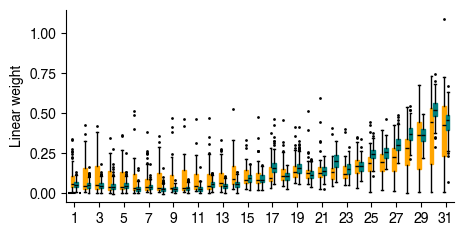

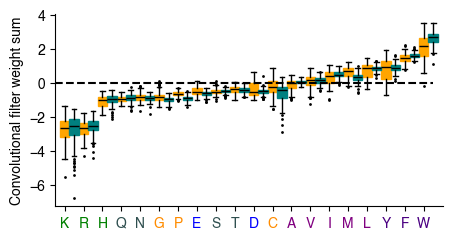

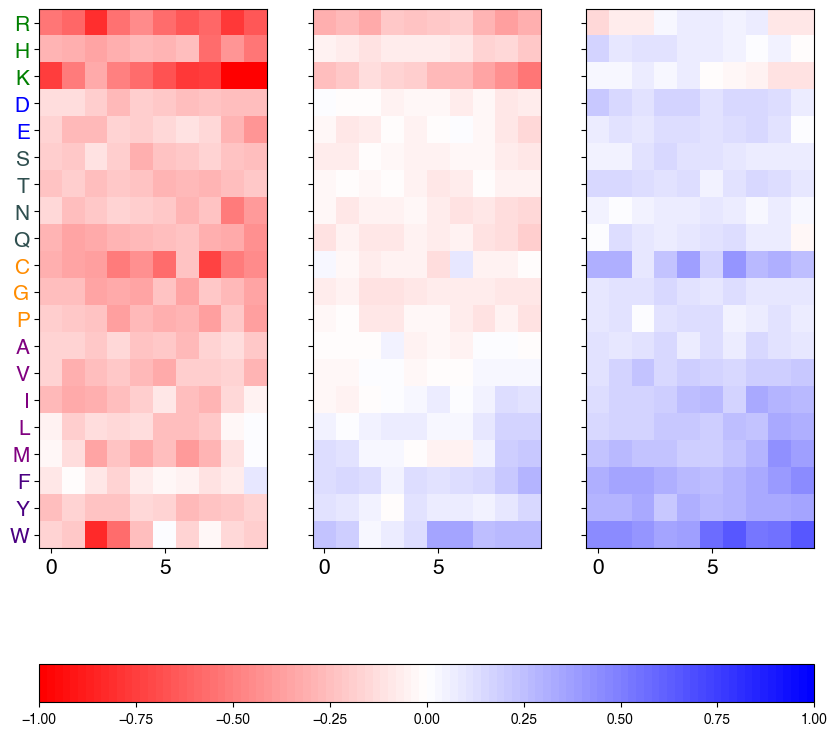

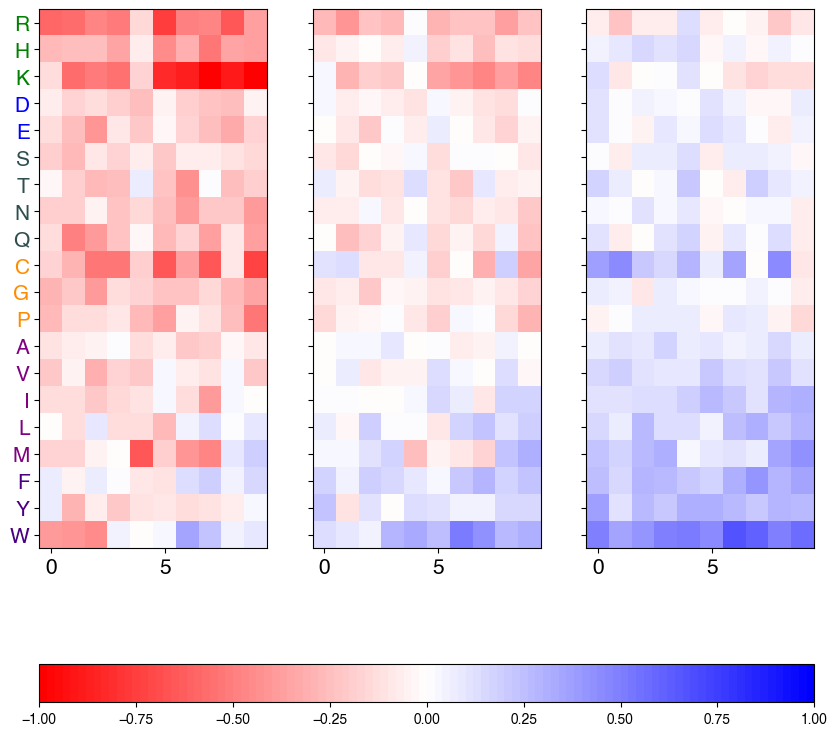

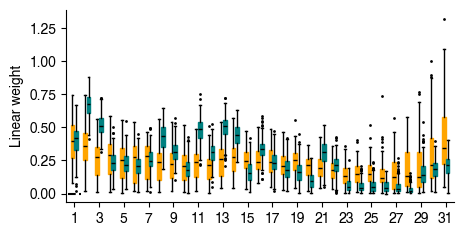

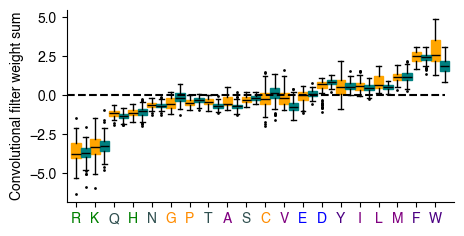

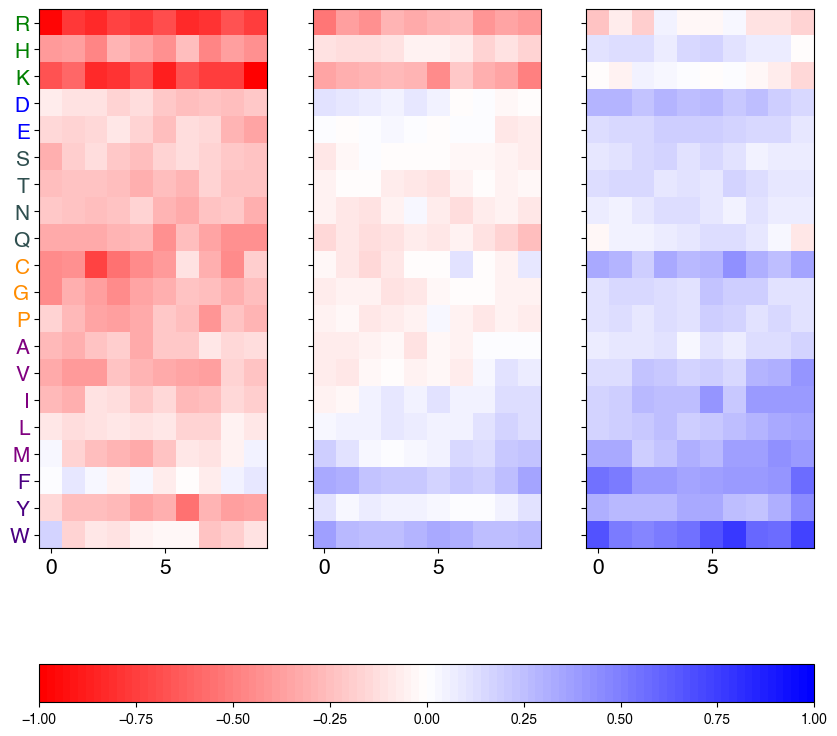

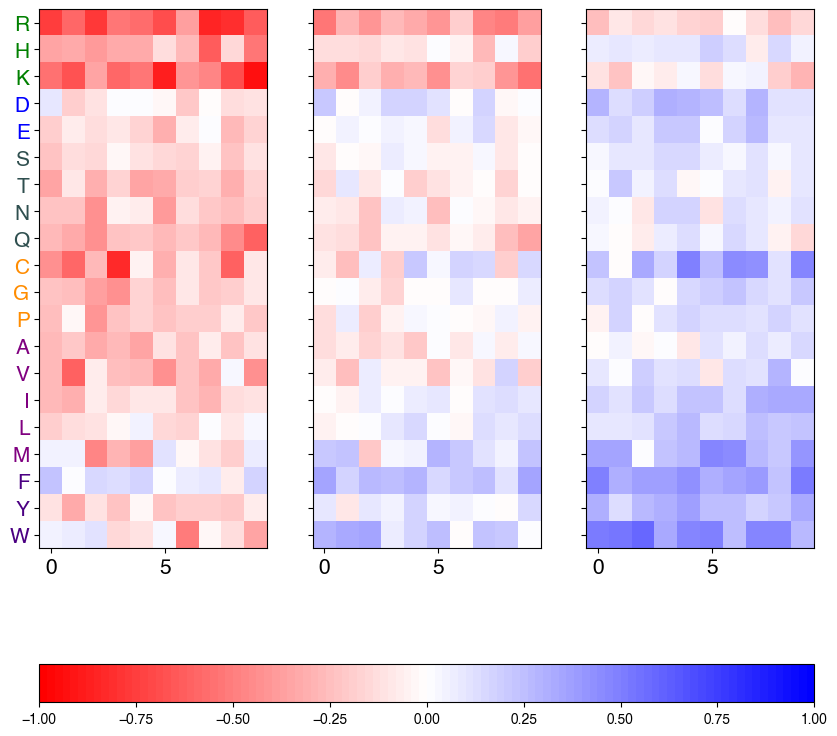

In [67]:
def run_analysis(k, seed=None, outfile_name = ""):
    seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
    seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

    if seed is not None: 
        boostrap_conv1_arr, bootstrap_linear1_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == seed], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
        boostrap_conv2_arr, bootstrap_linear2_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == seed], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')
    else:
        boostrap_conv1_arr, bootstrap_linear1_arr = get_weights_array(bootstrap_results, k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
        boostrap_conv2_arr, bootstrap_linear2_arr = get_weights_array(bootstrap_results, k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

    # Saving K1 weights
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_conv1_arr.npy", boostrap_conv1_arr)
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_linear1_arr.npy", bootstrap_linear1_arr)

    # Saving K2 weights
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_conv2_arr.npy", boostrap_conv2_arr)
    np.save(f"saved_weights/three_state_{outfile_name}_bootstrap_linear2_arr.npy", bootstrap_linear2_arr)

    # Calculating test stat array for K1
    bootstrap1_test_stat_arr = boostrap_conv1_arr.sum(axis=2) 
    seed1_test_stat_arr = seed_conv1_arr.sum(axis=2)

    # Calculating test stat array for K2
    bootstrap2_test_stat_arr = boostrap_conv2_arr.sum(axis=2) 
    seed2_test_stat_arr = seed_conv2_arr.sum(axis=2)

    # Mean variance for K1
    print("Bootstrap conv1 variance", np.var(boostrap_conv1_arr, axis=0).mean())
    print("Seed conv1 variance", np.var(seed_conv1_arr, axis=1).mean())

    # Mean variance for K2
    print("Bootstrap conv2 variance", np.var(boostrap_conv2_arr, axis=0).mean())
    print("Seed conv2 variance", np.var(seed_conv2_arr, axis=1).mean())

    # PLOTTING THE LINEAR WEIGHTS
    boxplot_linear_weights(seed_linear1_arr, bootstrap_linear1_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_linear1_weights.pdf", format='pdf', bbox_inches='tight')
    
    # Plotting boxplot for conv weight sum
    boxplot_conv_weights(seed1_test_stat_arr, bootstrap1_test_stat_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_conv1_weights.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    seed_conv_confidence_interval_plot(seed_conv1_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_seed_conv1_percentile.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    bootstrap_conv_confidence_interval_plot(boostrap_conv1_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_bootstrap_conv1_percentile.pdf", format='pdf', bbox_inches='tight')

    # PLOTTING THE LINEAR WEIGHTS
    boxplot_linear_weights(seed_linear2_arr, bootstrap_linear2_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_linear2_weights.pdf", format='pdf', bbox_inches='tight')
    
    # Plotting boxplot for conv weight sum
    boxplot_conv_weights(seed2_test_stat_arr, bootstrap2_test_stat_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_boxplot_conv2_weights.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    seed_conv_confidence_interval_plot(seed_conv2_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_seed_conv2_percentile.pdf", format='pdf', bbox_inches='tight')

    # Plotting 95% CI
    bootstrap_conv_confidence_interval_plot(boostrap_conv2_arr)
    plt.savefig(f"figures/for_revision/{outfile_name}_three_state_bootstrap_conv2_percentile.pdf", format='pdf', bbox_inches='tight')


# comparison_subset
run_analysis(10, outfile_name="k10")

# Kernel size 15

100%|██████████| 200/200 [00:00<00:00, 355.81it/s]


Bootstrap conv1 variance 0.010584670101396642
Seed conv1 variance 0.015903109286588724
Bootstrap conv2 variance 0.009668410227525976
Seed conv2 variance 0.015546112956864467


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 15, 20) (1, 15, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 15, 20) (1, 15, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


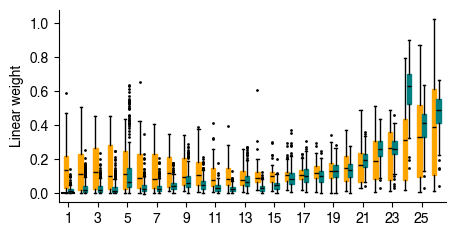

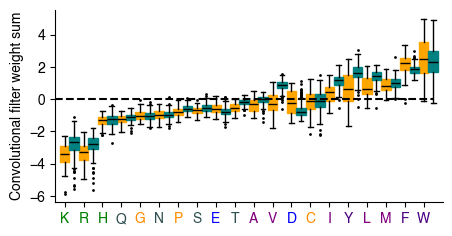

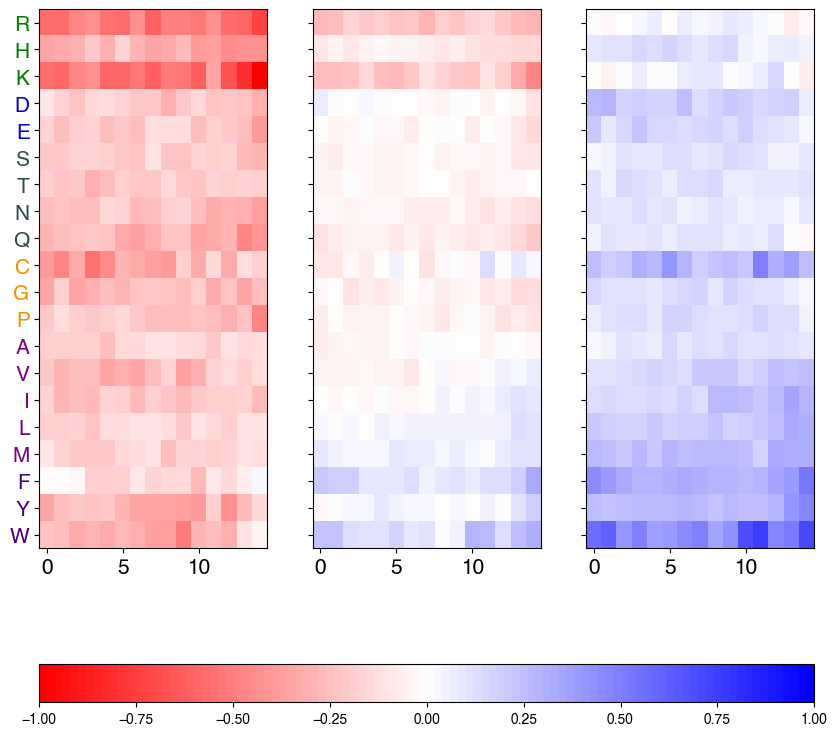

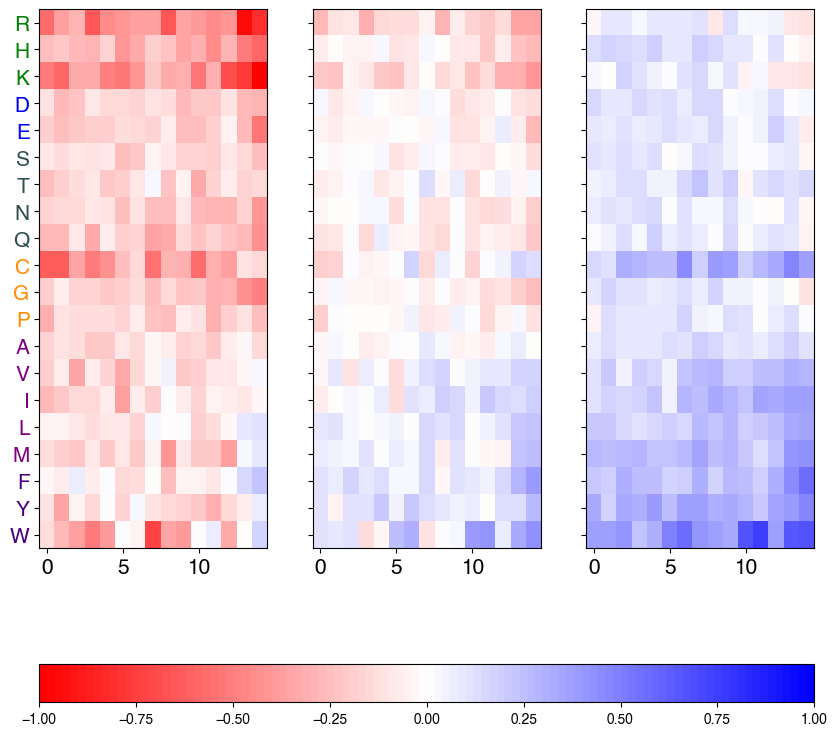

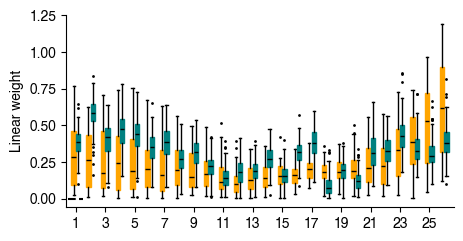

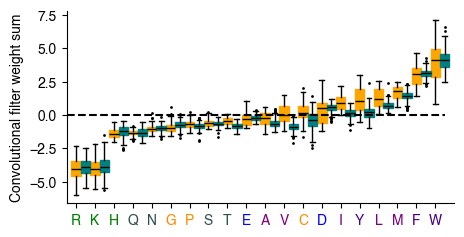

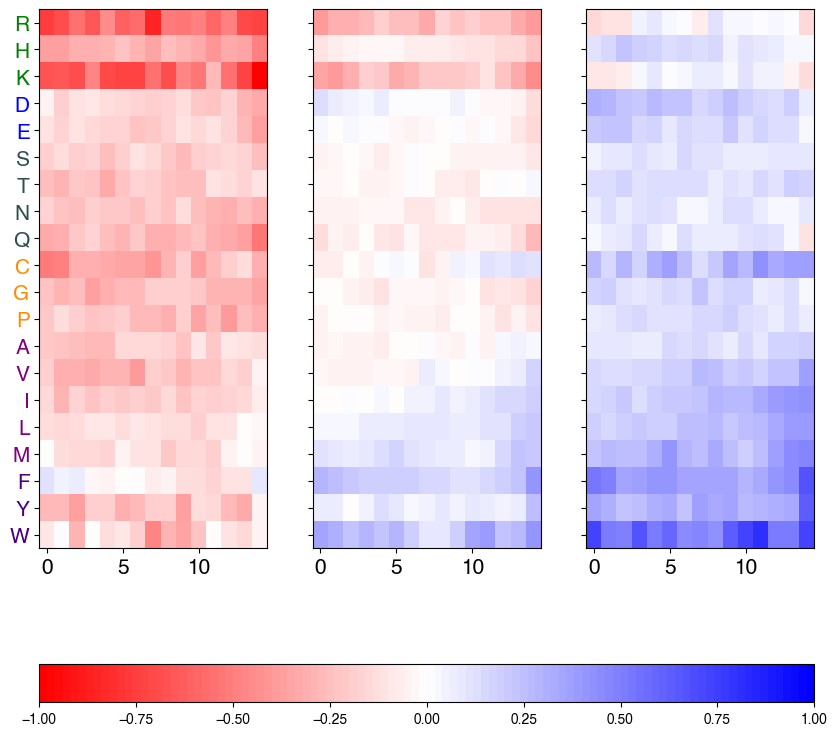

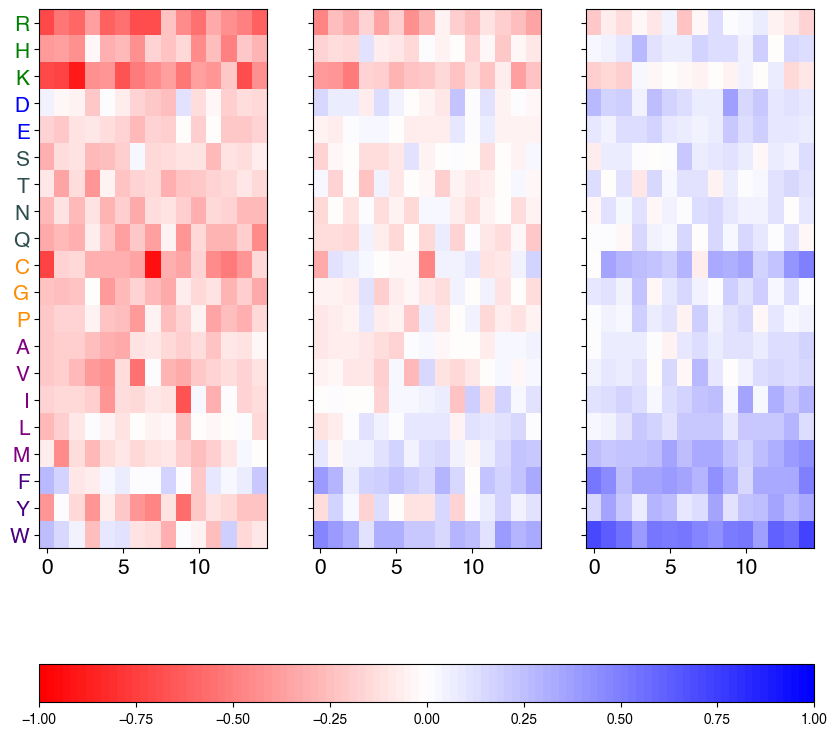

In [68]:
run_analysis(15, outfile_name="k15")

# Kernel size 20

  0%|          | 0/60 [00:00<?, ?it/s]

100%|██████████| 200/200 [00:00<00:00, 295.81it/s]


Bootstrap conv1 variance 0.005291146798995807
Seed conv1 variance 0.014185578478316342
Bootstrap conv2 variance 0.006793484705006475
Seed conv2 variance 0.012205851816729472


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 20, 20) (1, 20, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 20, 20) (1, 20, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


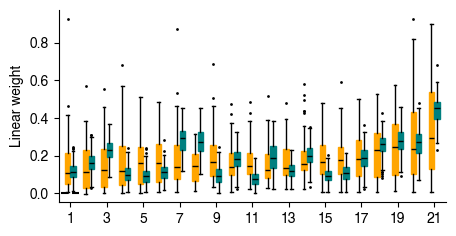

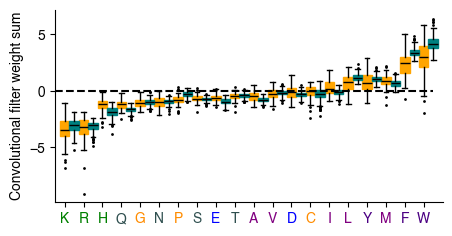

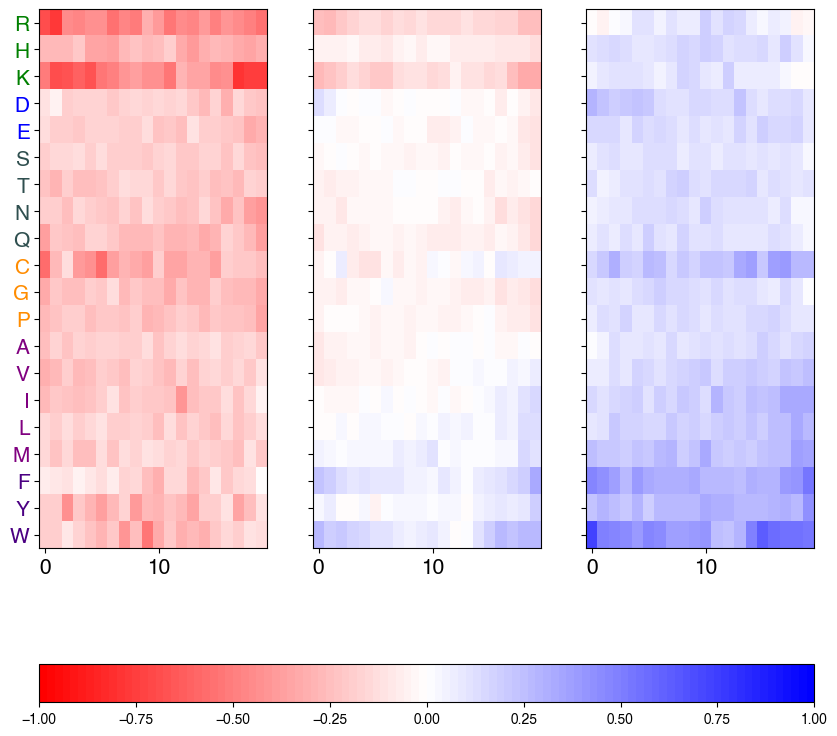

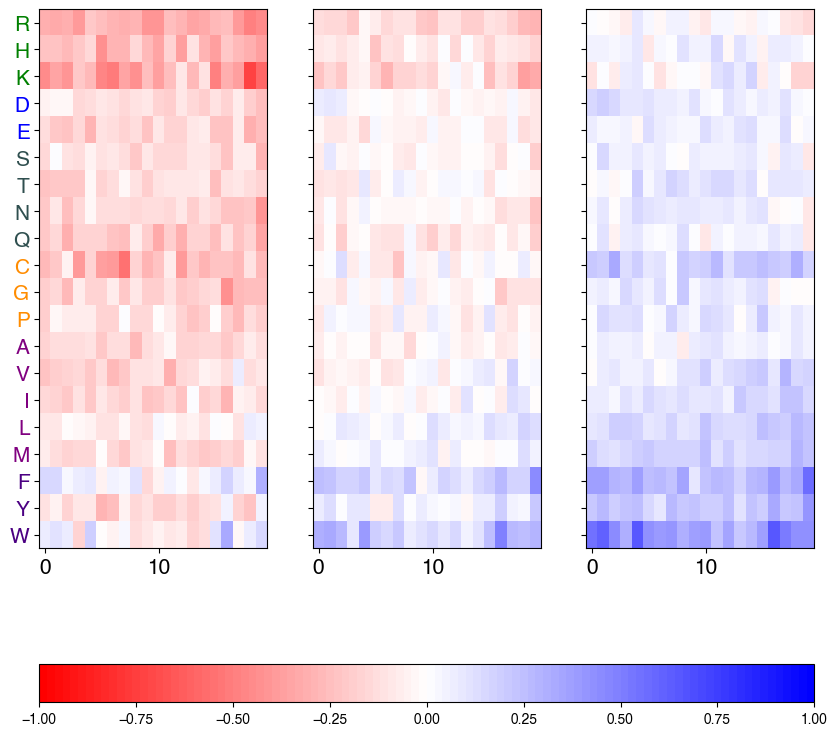

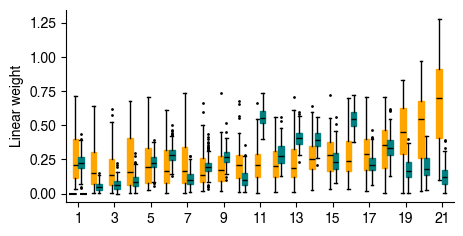

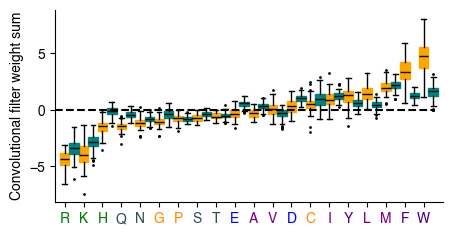

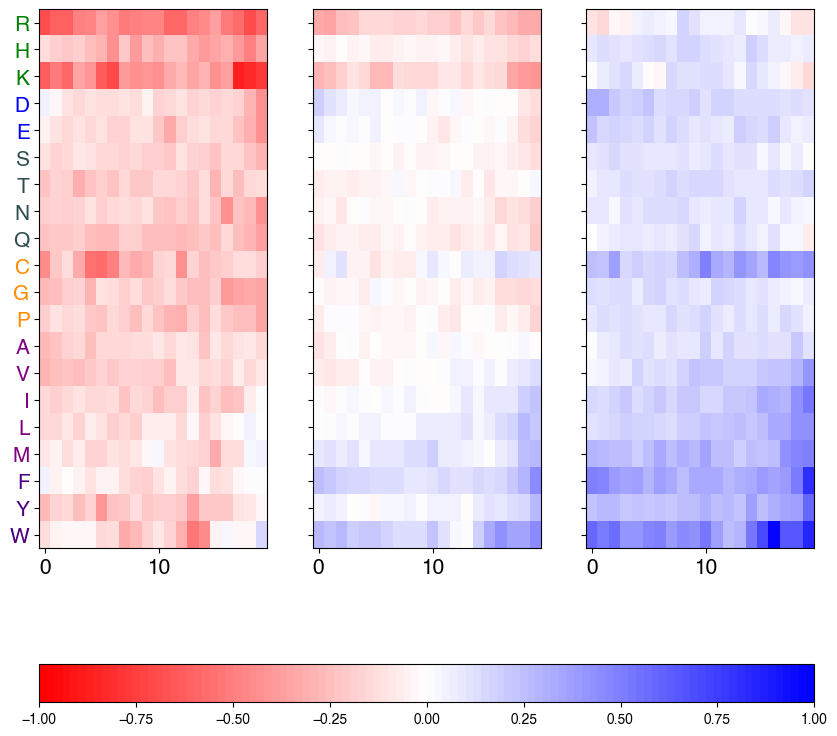

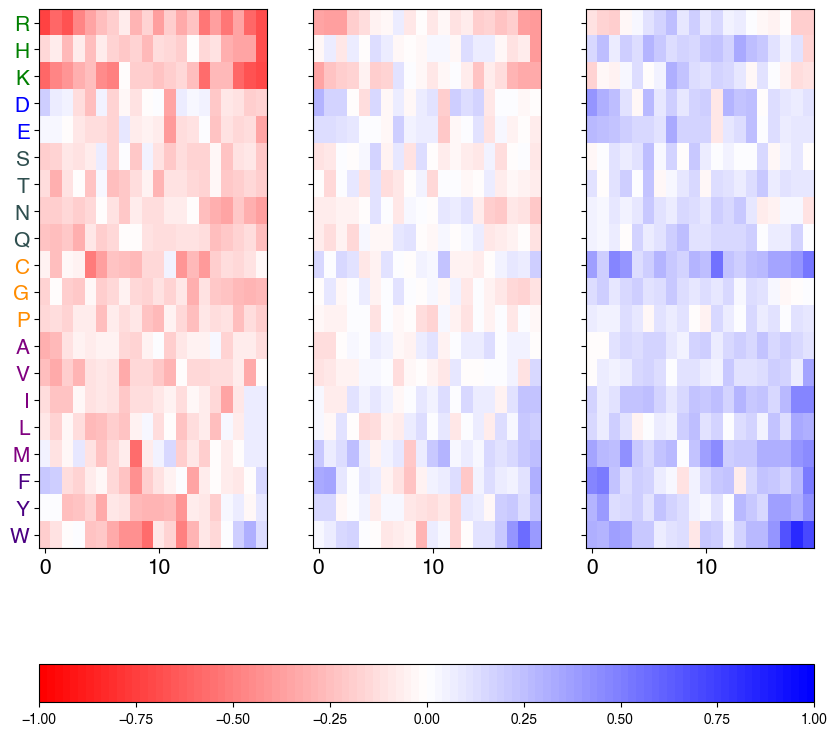

In [69]:
run_analysis(20, outfile_name="k20")

# Kernel size of 30

100%|██████████| 200/200 [00:00<00:00, 389.04it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


Bootstrap conv1 variance 0.009525950455384034
Seed conv1 variance 0.008717340989228
Bootstrap conv2 variance 0.003907467093176522
Seed conv2 variance 0.007478308255135838


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 30, 20) (1, 30, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 30, 20) (1, 30, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


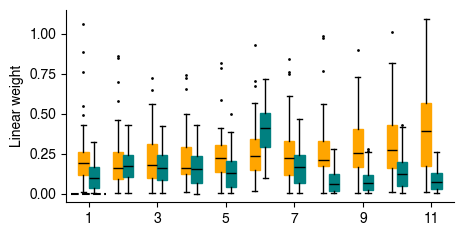

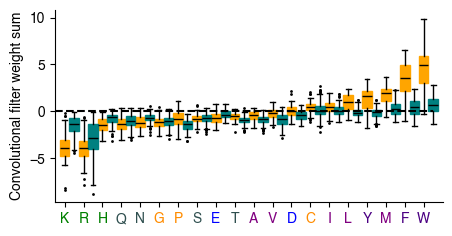

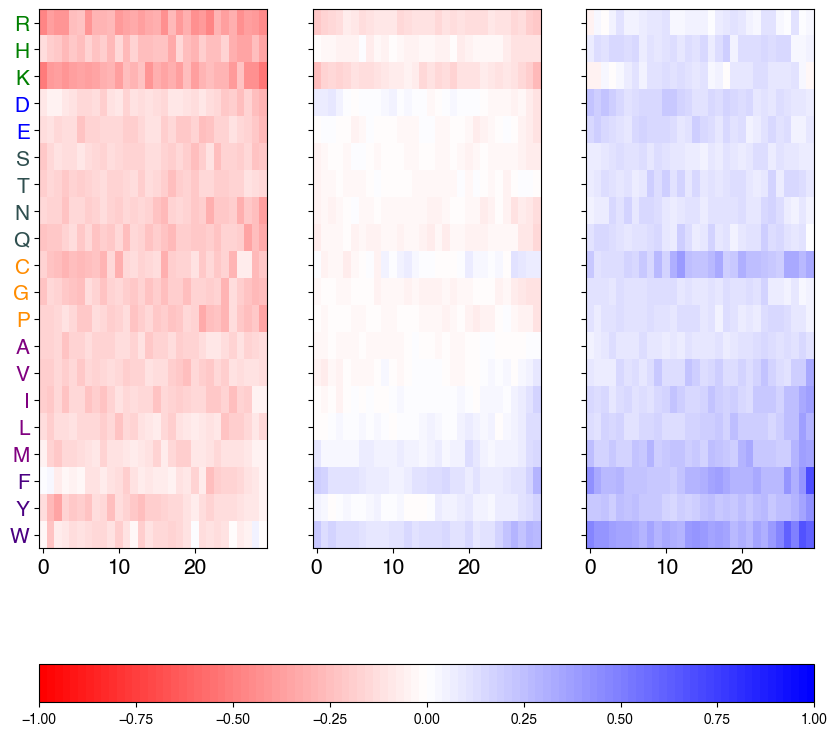

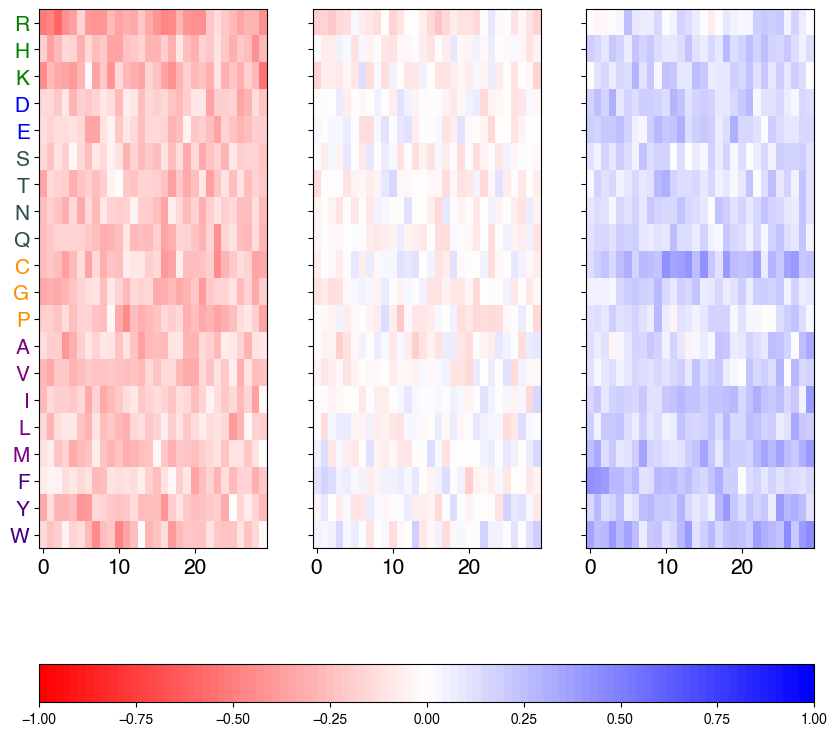

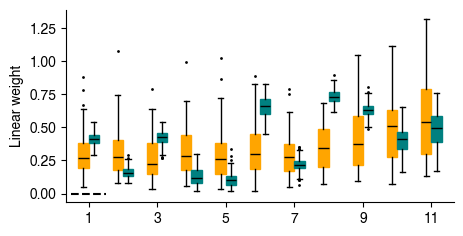

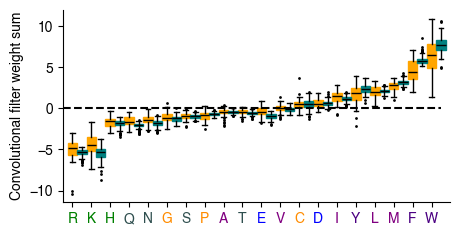

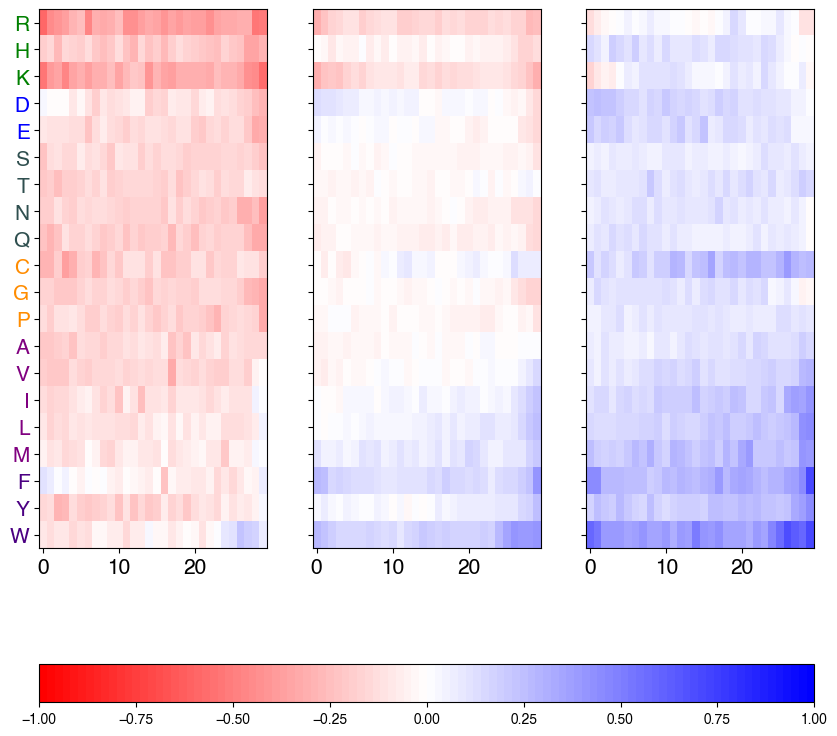

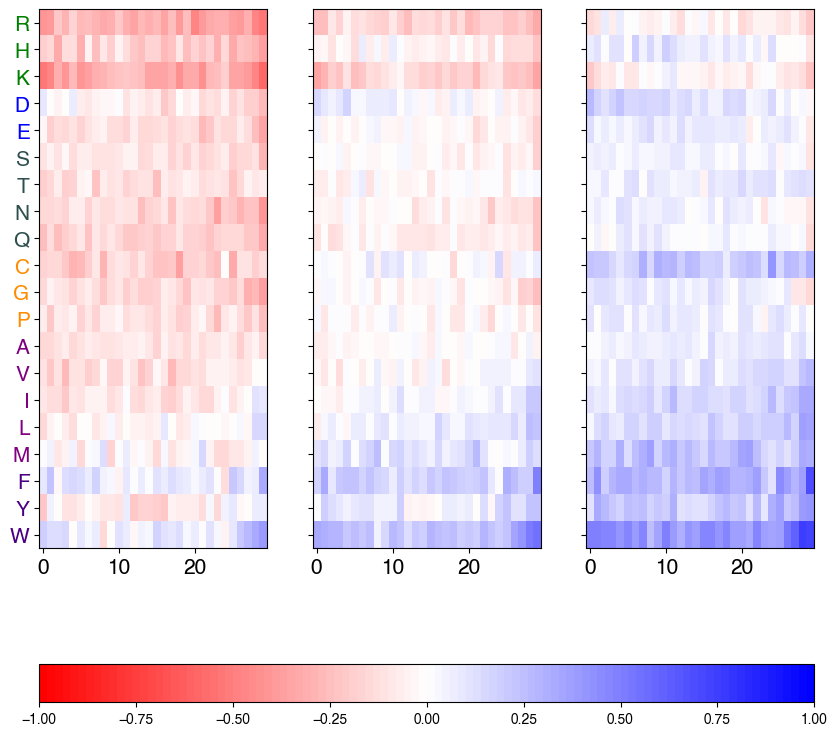

In [70]:
run_analysis(30, outfile_name="k30")

# K = 40

100%|██████████| 200/200 [00:00<00:00, 374.34it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


Bootstrap conv1 variance 0.03138711807105588
Seed conv1 variance 0.016476061688472255
Bootstrap conv2 variance 0.021182173491931345
Seed conv2 variance 0.024584853229055587


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 40, 20) (1, 40, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


(1, 40, 20) (1, 40, 20)


1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


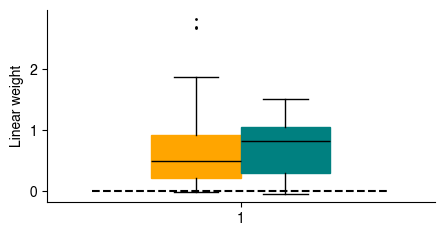

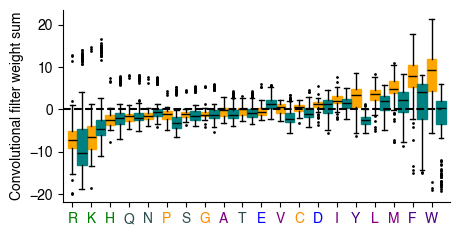

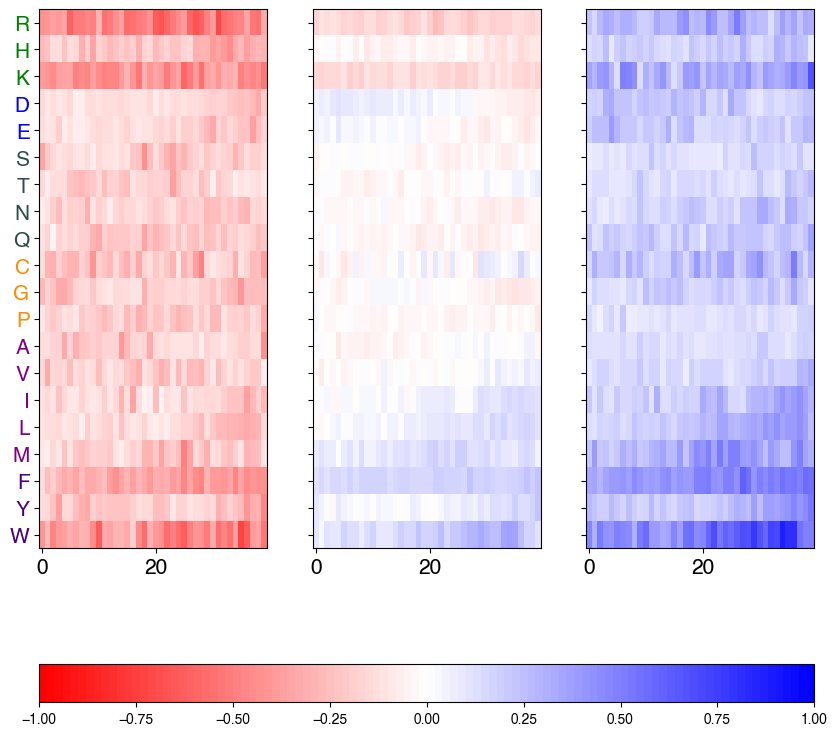

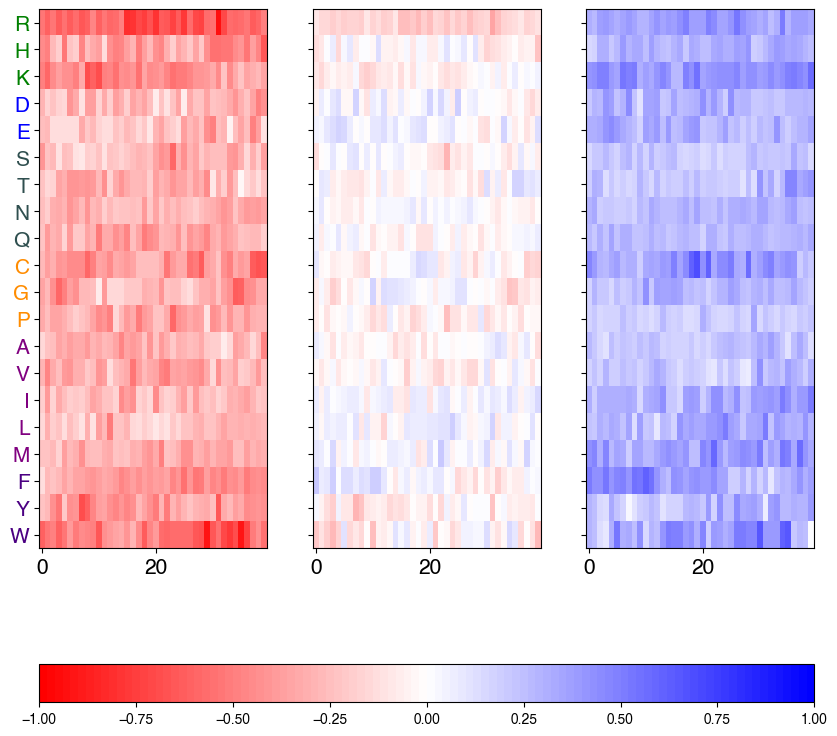

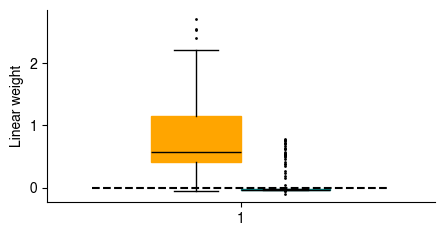

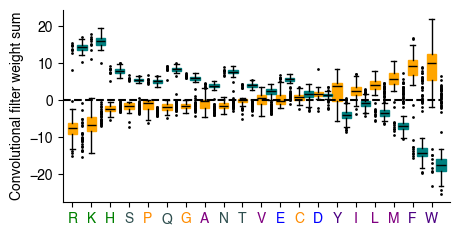

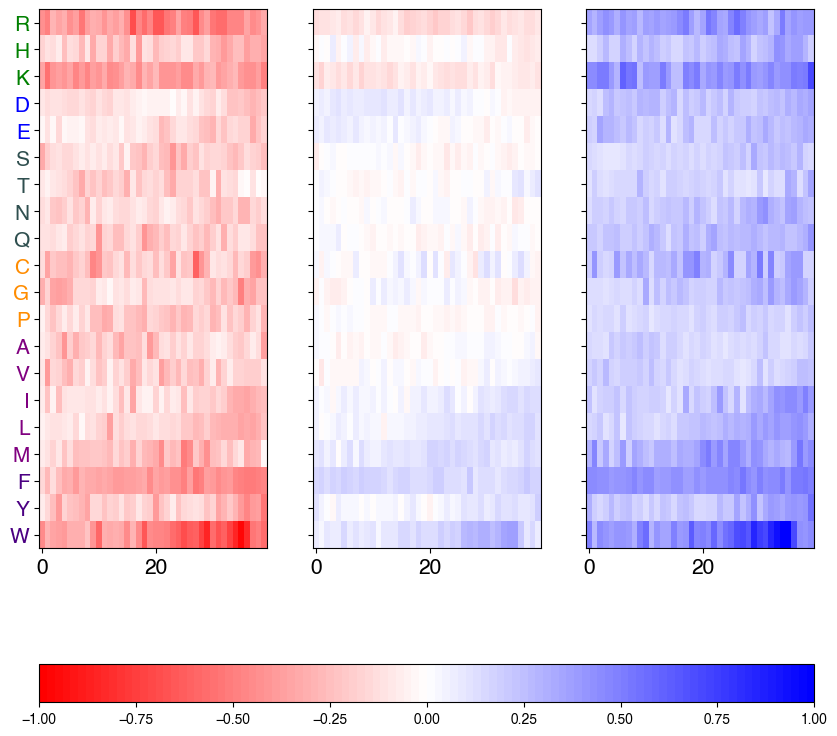

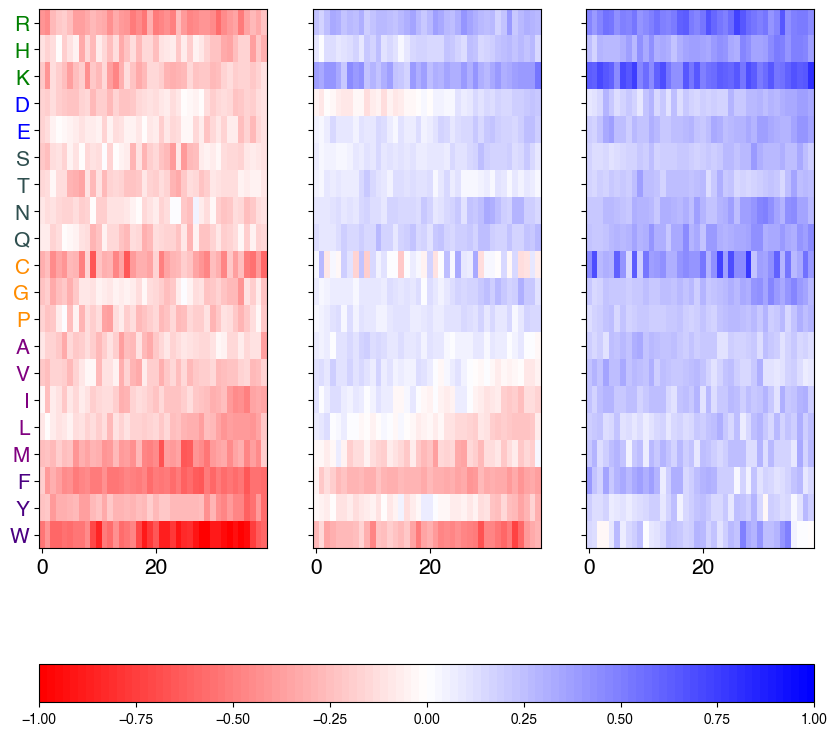

In [71]:
run_analysis(40, outfile_name="k40")

In [ ]:
k = 40

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

100%|██████████| 60/60 [00:00<00:00, 371.81it/s]


In [114]:
neg_mask = seed_linear1_arr < 0

In [126]:
neg_mask = neg_mask.reshape(60)

In [128]:
neg_mask.shape

(60,)

In [129]:
seed_linear1_arr.shape

(1, 60, 1)

  0%|          | 0/60 [00:00<?, ?it/s]

100%|██████████| 60/60 [00:00<00:00, 281.91it/s]


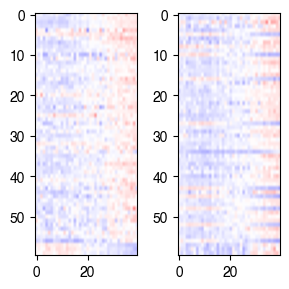

In [152]:
# Could I somehow sort by performance??
# Need to make this for two state model
# Is this more useful than showing the percentiles??
k = 40

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

neg_mask = seed_linear1_arr < 0
neg_mask = neg_mask.reshape(60)

negative_conv1_filters = seed_conv1_arr[:, neg_mask, :, :]
pos_conv1_filters = seed_conv1_arr[:, ~neg_mask, :, :]

negative_conv2_filters = seed_conv2_arr[:, neg_mask, :, :]
pos_conv2_filters = seed_conv2_arr[:, ~neg_mask, :, :]

lim = max(seed_conv1_arr.min(), seed_conv1_arr.max())

fig, axs = plt.subplots(1, 2, figsize=(3, 3))
cax = axs[0].imshow(np.concatenate([pos_conv1_filters[0, :, :, 3], negative_conv1_filters[0, :, :, 3]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
axs[1].imshow(np.concatenate([pos_conv2_filters[0, :, :, 3], negative_conv2_filters[0, :, :, 3]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)

fig.tight_layout()

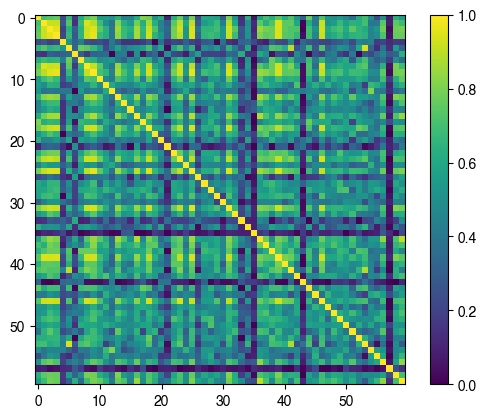

In [ ]:
import numpy as np


# X has shape (60, n_features)
sim_matrix = cosine_similarity(seed_conv1_arr[0, :, :, 3])

plt.imshow(np.abs(sim_matrix), vmax=1, vmin=0)
plt.colorbar()

Text(0.5, 0, 'Cosine similarity between weights')

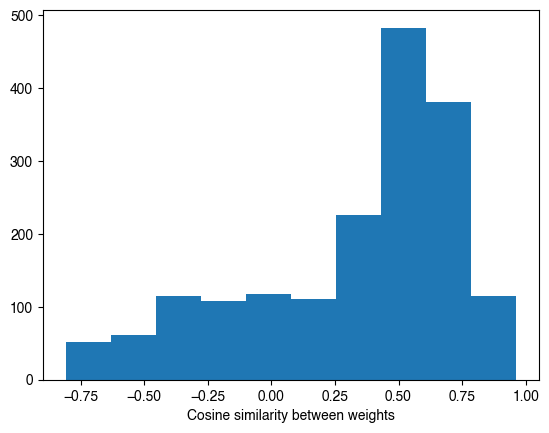

In [173]:
lower_vals = sim_matrix[np.tril_indices(sim_matrix.shape[0], k=-1)]
plt.hist(lower_vals)
plt.xlabel("Cosine similarity between weights")

In [154]:
bootstrap_results['seed'].value_counts()

seed
1298091    1200
Name: count, dtype: int64

100%|██████████| 200/200 [00:00<00:00, 327.90it/s]


In [164]:
boostrap_conv2_arr.shape

(200, 1, 40, 20)

In [167]:
pos_conv1_filters.shape

(171, 1, 40, 20)

100%|██████████| 200/200 [00:00<00:00, 329.55it/s]


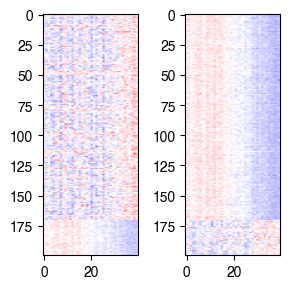

In [174]:
boostrap_conv1_arr, bootstrap_linear1_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == 1298091], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
boostrap_conv2_arr, bootstrap_linear2_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == 1298091], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

neg_mask = bootstrap_linear1_arr < 0
neg_mask = neg_mask.reshape(200)

negative_conv1_filters = boostrap_conv1_arr[neg_mask, :, :, :]
pos_conv1_filters = boostrap_conv1_arr[~neg_mask, :, :, :]

negative_conv2_filters = boostrap_conv2_arr[neg_mask, :, :, :]
pos_conv2_filters = boostrap_conv2_arr[~neg_mask, :, :, :]

lim = max(boostrap_conv1_arr.min(), boostrap_conv1_arr.max())

fig, axs = plt.subplots(1, 2, figsize=(3, 3))
cax = axs[0].imshow(np.concatenate([pos_conv1_filters[:, 0, :, 3], negative_conv1_filters[:, 0, :, 3]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
axs[1].imshow(np.concatenate([pos_conv2_filters[:, 0, :, 3], negative_conv2_filters[:, 0, :, 3]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)

fig.tight_layout()

100%|██████████| 60/60 [00:00<00:00, 360.86it/s]


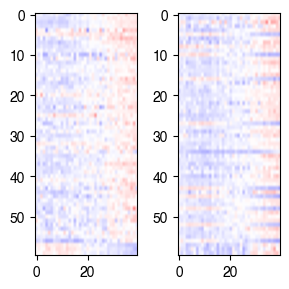

In [190]:
# Could I somehow sort by performance??
# Need to make this for two state model
# Is this more useful than showing the percentiles??
k = 40

seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

neg_mask = seed_linear1_arr < 0
neg_mask = neg_mask.reshape(60)

negative_conv1_filters = seed_conv1_arr[:, neg_mask, :, :]
pos_conv1_filters = seed_conv1_arr[:, ~neg_mask, :, :]

negative_conv2_filters = seed_conv2_arr[:, neg_mask, :, :]
pos_conv2_filters = seed_conv2_arr[:, ~neg_mask, :, :]

lim = max(seed_conv1_arr.min(), seed_conv1_arr.max())

fig, axs = plt.subplots(1, 2, figsize=(3, 3))
cax = axs[0].imshow(np.concatenate([pos_conv1_filters[0, :, :, 3], negative_conv1_filters[0, :, :, 3]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
axs[1].imshow(np.concatenate([pos_conv2_filters[0, :, :, 3], negative_conv2_filters[0, :, :, 3]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)

fig.tight_layout()

In [15]:
plt.rcParams.update({
    "font.size": 16,
    "axes.titlesize": 16,
    "axes.labelsize": 16,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
})

In [44]:
def make_all_weight_heatmaps(k, model_results, bootstrap_results): 
    aa_order= ["R","H","K","D","E","S","T","N","Q","C","G","P","A","V","I","L","M","F","Y","W"]

    # Seed weight arrays
    seed_conv1_arr, seed_linear1_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
    seed_conv2_arr, seed_linear2_arr = get_weights_array(model_results, k_size=k, num_bootstraps=1, num_seeds=60, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

    neg1_mask = (seed_linear1_arr < 0).any(axis=-1)
    neg1_mask = neg1_mask.reshape(60)

    neg2_mask = (seed_linear2_arr < 0).any(axis=-1)
    neg2_mask = neg2_mask.reshape(60)

    negative1_conv1_filters = seed_conv1_arr[:, neg1_mask, :, :]
    negative1_conv2_filters = seed_conv2_arr[:, neg1_mask, :, :]

    negative2_conv1_filters = seed_conv1_arr[:, ((~neg1_mask) & neg2_mask), :, :]
    negative2_conv2_filters = seed_conv2_arr[:, ((~neg1_mask) & neg2_mask), :, :]

    pos_conv1_filters = seed_conv1_arr[:, ((~neg1_mask) & (~neg2_mask)), :, :]
    pos_conv2_filters = seed_conv2_arr[:, ((~neg1_mask) & (~neg2_mask)), :, :]

    lim = max(seed_conv1_arr.min(), seed_conv1_arr.max())

    # First plot -- Seed K1
    fig, axs = plt.subplots(2, 20, figsize=(20, 4), gridspec_kw={'height_ratios': [3, 1]})

    for i in range(0, 20):
        cax = axs[0, i].imshow(np.concatenate([pos_conv1_filters[0, :, :, i], negative1_conv1_filters[0, :, :, i], negative2_conv1_filters[0, :, :, i]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
        axs[0, i].set_xticks([])
        axs[0, i].set_xlabel(aa_order[i])

        sim_matrix = cosine_similarity(seed_conv1_arr[0, :, :, i])
        lower_vals = sim_matrix[np.tril_indices(sim_matrix.shape[0], k=-1)]
        axs[1, i].hist(lower_vals)
        axs[1, i].text(0.05, 0.7, f"{np.abs(lower_vals).mean():.2}", transform=axs[1, i].transAxes)
        axs[1, i].set_xlabel(aa_order[i])
        if i != 0:
            axs[0, i].tick_params(labelleft=False)
            axs[1,i].sharey(axs[1,0])
            axs[1,i].sharex(axs[1,0])
            # axs[1, i].set_yticks([])
            axs[1, i].tick_params(labelleft=False)
        else:
            axs[0, 0].set_ylabel("NNs")
            axs[1, 0].set_ylabel("Count")
            axs[1, 0].set_xlim(-1, 1)


    fig.supxlabel("Cosine similarity between weights per amino acid", y=-0.1)
    fig.suptitle(r"NN weights per amino acid for predicting $K_{open}$. NNs were trained with different seeds")

    # fig.tight_layout()
    plt.savefig(f"figures/for_revision/k{k}_conv1_three_state_seed_all_weights.pdf", format='pdf', bbox_inches='tight')

    fig, axs = plt.subplots(2, 20, figsize=(20, 4), gridspec_kw={'height_ratios': [3, 1]})

    # Second plot -- Seed K2
    for i in range(0, 20):
        cax = axs[0, i].imshow(np.concatenate([pos_conv2_filters[0, :, :, i], negative1_conv2_filters[0, :, :, i], negative2_conv2_filters[0, :, :, i]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
        axs[0, i].set_xticks([])
        axs[0, i].set_xlabel(aa_order[i])

        sim_matrix = cosine_similarity(seed_conv2_arr[0, :, :, i])
        lower_vals = sim_matrix[np.tril_indices(sim_matrix.shape[0], k=-1)]
        axs[1, i].hist(lower_vals)
        axs[1, i].text(0.05, 0.7, f"{np.abs(lower_vals).mean():.2}", transform=axs[1, i].transAxes)
        axs[1, i].set_xlabel(aa_order[i])
        if i != 0:
            axs[0, i].tick_params(labelleft=False)
            axs[1,i].sharey(axs[1,0])
            axs[1,i].sharex(axs[1,0])
            # axs[1, i].set_yticks([])
            axs[1, i].tick_params(labelleft=False)
        else:
            axs[0, 0].set_ylabel("NNs")
            axs[1, 0].set_ylabel("Count")
            axs[1, 0].set_xlim(-1, 1)


    fig.supxlabel("Cosine similarity between weights per amino acid", y=-0.1)
    fig.suptitle(r"NN weights per amino acid for predicting $K_{bound}$. NNs were trained with different seeds")

    # fig.tight_layout()
    plt.savefig(f"figures/for_revision/k{k}_conv2_three_state_seed_all_weights.pdf", format='pdf', bbox_inches='tight')

    # bootstrap weight arrays
    boostrap_conv1_arr, bootstrap_linear1_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == 1298091], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv1.weight', layer2='linear1.weight')
    boostrap_conv2_arr, bootstrap_linear2_arr = get_weights_array(bootstrap_results[bootstrap_results['seed'] == 1298091], k_size=k, num_bootstraps=200, num_seeds=1, three_state=True, abund_k=False, layer1='conv2.weight', layer2='linear2.weight')

    neg1_mask = (bootstrap_linear1_arr < 0).any(axis=-1)
    neg1_mask = neg1_mask.reshape(200)

    neg2_mask = (bootstrap_linear2_arr < 0).any(axis=-1)
    neg2_mask = neg2_mask.reshape(200)

    negative1_conv1_filters = boostrap_conv1_arr[neg1_mask, :, :, :]
    negative1_conv2_filters = boostrap_conv2_arr[neg1_mask, :, :, :]

    negative2_conv1_filters = boostrap_conv1_arr[((~neg1_mask) & neg2_mask), :, :]
    negative2_conv2_filters = boostrap_conv2_arr[((~neg1_mask) & neg2_mask), :, :]

    pos_conv1_filters = boostrap_conv1_arr[((~neg1_mask) & (~neg2_mask)), :, :, :]
    pos_conv2_filters = boostrap_conv2_arr[((~neg1_mask) & (~neg2_mask)), :, :, :]

    lim = max(boostrap_conv1_arr.min(), boostrap_conv1_arr.max(), boostrap_conv2_arr.min(), boostrap_conv2_arr.max())

    # Plotting bootstrap K1
    fig, axs = plt.subplots(2, 20, figsize=(20, 4), gridspec_kw={'height_ratios': [3, 1]})

    for i in range(0, 20):
        cax = axs[0, i].imshow(np.concatenate([pos_conv1_filters[:, 0, :, i], negative1_conv1_filters[:, 0, :, i], negative2_conv1_filters[:, 0, :, i]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
        axs[0, i].set_xticks([])
        axs[0, i].set_xlabel(aa_order[i])

        sim_matrix = cosine_similarity(boostrap_conv1_arr[:, 0, :, i])
        lower_vals = sim_matrix[np.tril_indices(sim_matrix.shape[0], k=-1)]
        axs[1, i].hist(lower_vals)
        axs[1, i].text(0.05, .7, f"{np.abs(lower_vals).mean():.2}", transform=axs[1, i].transAxes)
        axs[1, i].set_xlabel(aa_order[i])
        if i != 0:
            axs[0, i].tick_params(labelleft=False)
            axs[1,i].sharey(axs[1,0])
            axs[1,i].sharex(axs[1,0])
            # axs[1, i].set_yticks([])
            axs[1, i].tick_params(labelleft=False)
        else:
            axs[0, 0].set_ylabel("NNs")
            axs[1, 0].set_ylabel("Count")
            axs[1, 0].set_xlim(-1, 1)


    fig.supxlabel("Cosine similarity between weights per amino acid", y=-0.1)
    fig.suptitle(r"NN weights per amino acid for predicting $K_{open}$. NNs were trained with bootstrapped data")

    # fig.tight_layout()
    plt.savefig(f"figures/for_revision/k{k}_conv1_three_state_bootstrap_all_weights.pdf", format='pdf', bbox_inches='tight')

    # Plotting bootstrap K2
    fig, axs = plt.subplots(2, 20, figsize=(20, 4), gridspec_kw={'height_ratios': [3, 1]})

    for i in range(0, 20):
        cax = axs[0, i].imshow(np.concatenate([pos_conv2_filters[:, 0, :, i], negative1_conv2_filters[:, 0, :, i], negative2_conv2_filters[:, 0, :, i]]), cmap=custom_cmap, aspect='auto',vmin=-lim,vmax=lim)
        axs[0, i].set_xticks([])
        axs[0, i].set_xlabel(aa_order[i])

        sim_matrix = cosine_similarity(boostrap_conv2_arr[:, 0, :, i])
        lower_vals = sim_matrix[np.tril_indices(sim_matrix.shape[0], k=-1)]
        axs[1, i].hist(lower_vals)
        axs[1, i].text(0.05, 0.7, f"{np.abs(lower_vals).mean():.2}", transform=axs[1, i].transAxes)
        axs[1, i].set_xlabel(aa_order[i])
        if i != 0:
            axs[0, i].tick_params(labelleft=False)
            axs[1,i].sharey(axs[1,0])
            axs[1,i].sharex(axs[1,0])
            # axs[1, i].set_yticks([])
            axs[1, i].tick_params(labelleft=False)
        else:
            axs[0, 0].set_ylabel("NNs")
            axs[1, 0].set_ylabel("Count")
            axs[1, 0].set_xlim(-1, 1)


    fig.supxlabel("Cosine similarity between weights per amino acid", y=-0.1)
    fig.suptitle(r"NN weights per amino acid for predicting $K_{bound}$. NNs were trained with bootstrapped data")

    # fig.tight_layout()
    plt.savefig(f"figures/for_revision/k{k}_conv2_three_state_bootstrap_all_weights.pdf", format='pdf', bbox_inches='tight')


100%|██████████| 60/60 [00:00<00:00, 699.11it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
100%|██████████| 200/200 [00:00<00:00, 401.82it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


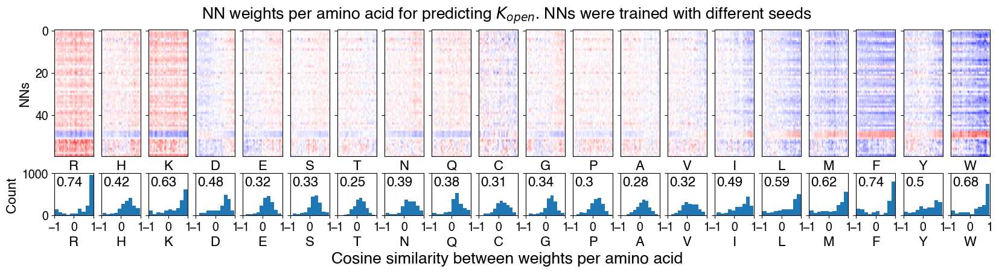

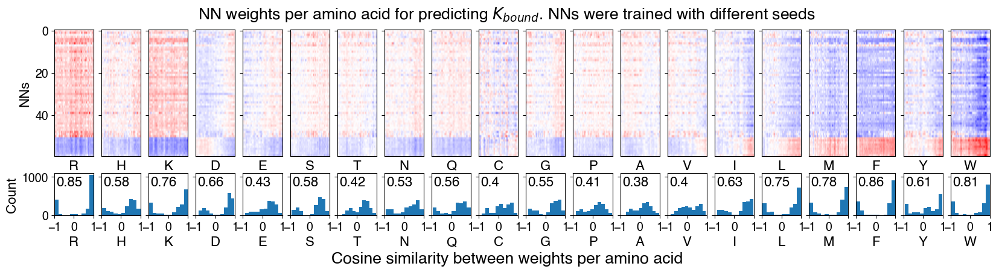

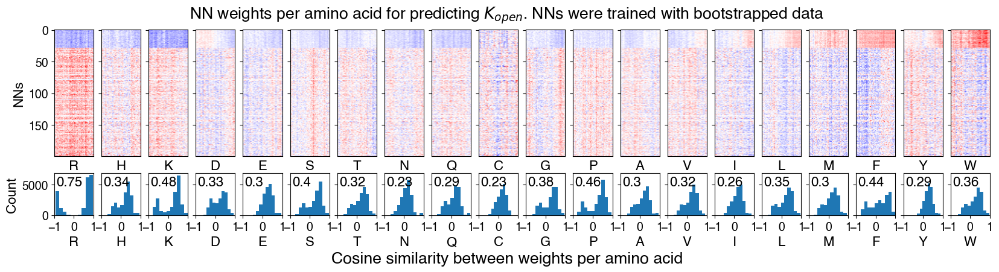

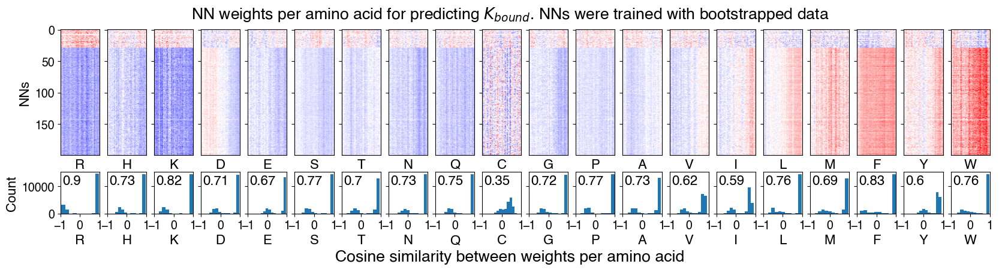

In [46]:
make_all_weight_heatmaps(40, model_results, bootstrap_results)

100%|██████████| 60/60 [00:00<00:00, 125.77it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
100%|██████████| 200/200 [00:00<00:00, 443.78it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


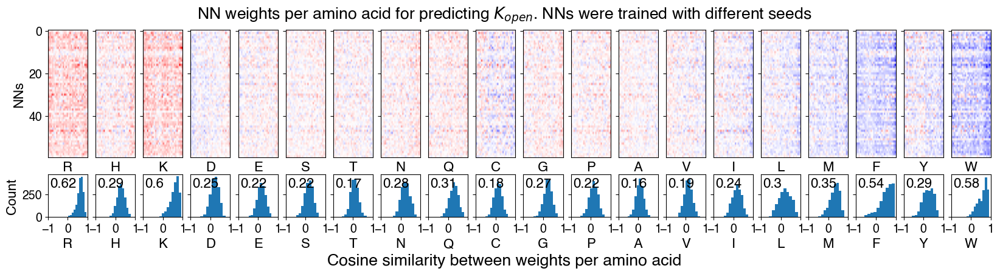

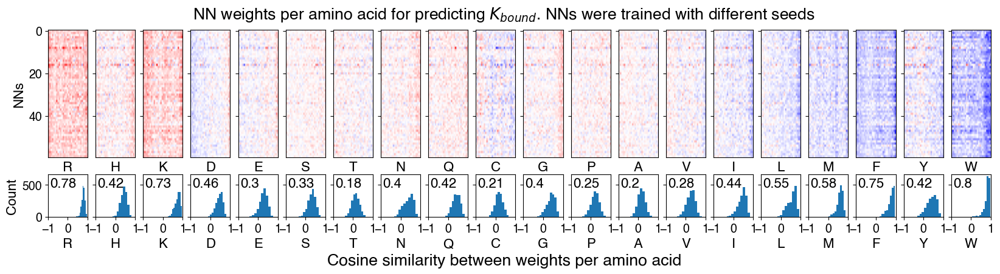

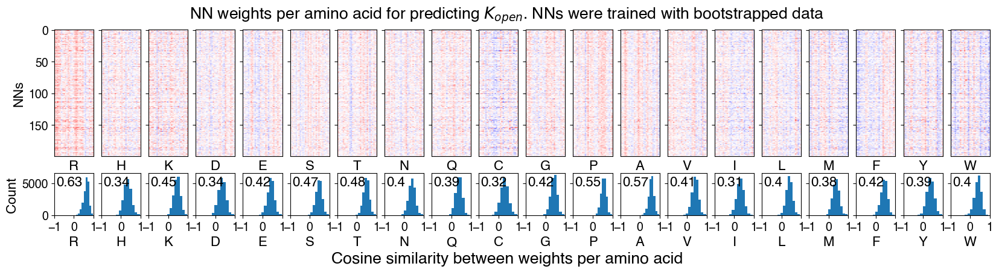

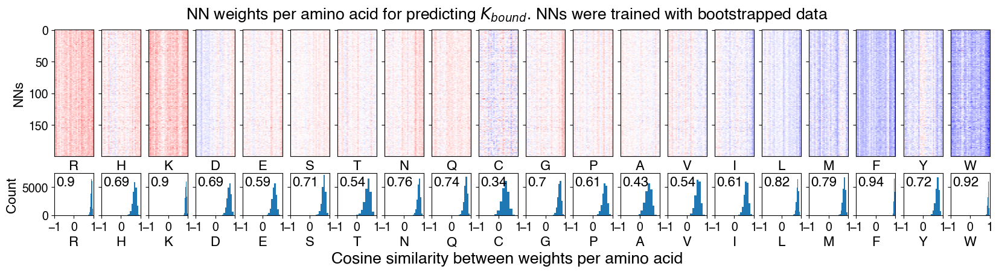

In [45]:
make_all_weight_heatmaps(30, model_results, bootstrap_results)

100%|██████████| 60/60 [00:00<00:00, 493.77it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
100%|██████████| 200/200 [00:00<00:00, 479.86it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


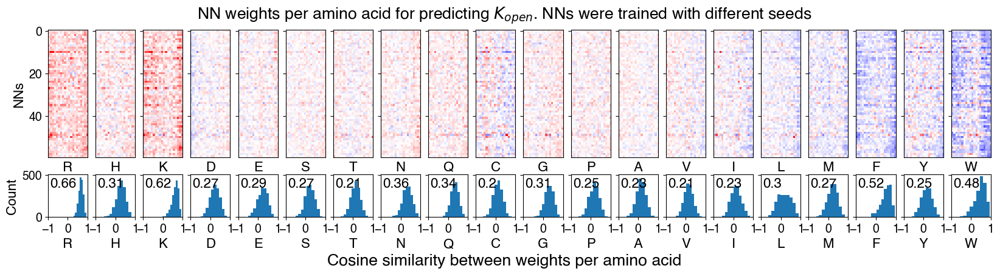

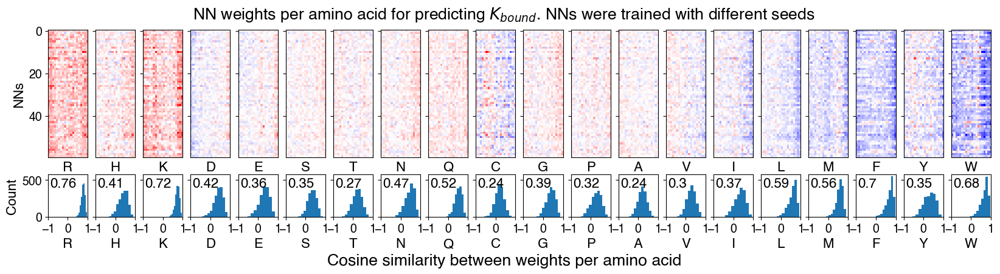

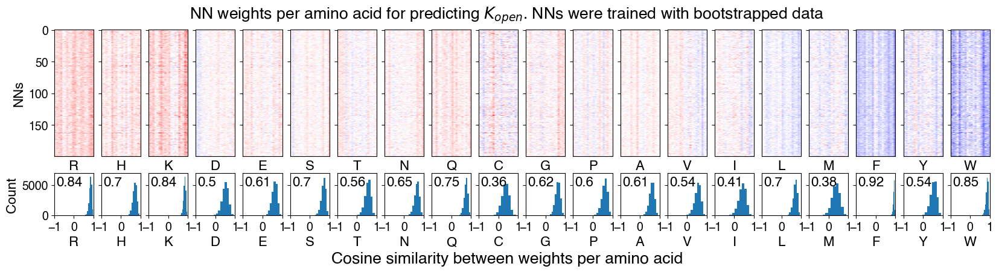

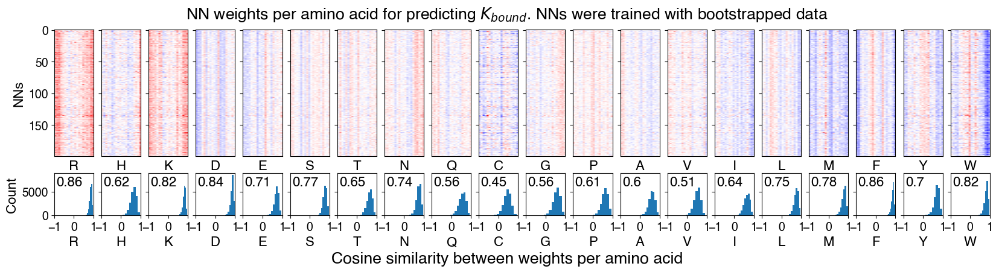

In [47]:
make_all_weight_heatmaps(20, model_results, bootstrap_results)

100%|██████████| 60/60 [00:00<00:00, 493.00it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
100%|██████████| 200/200 [00:00<00:00, 553.39it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


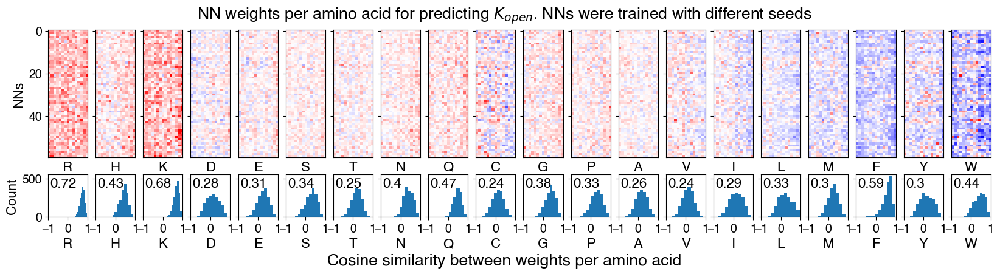

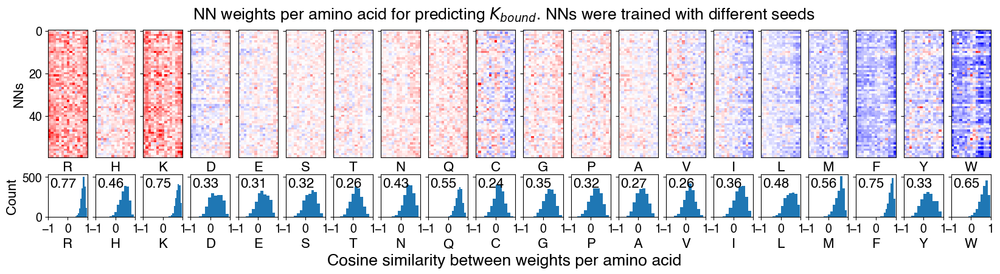

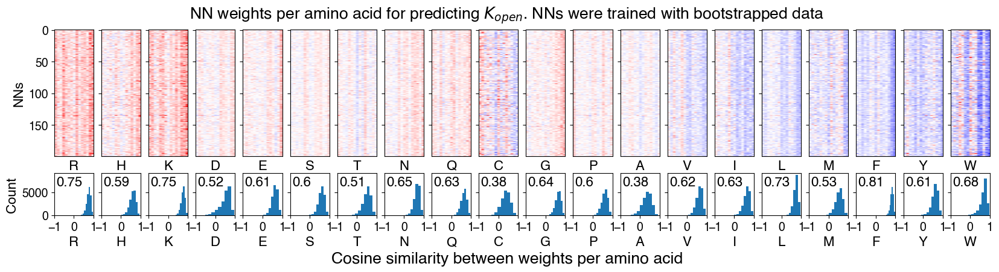

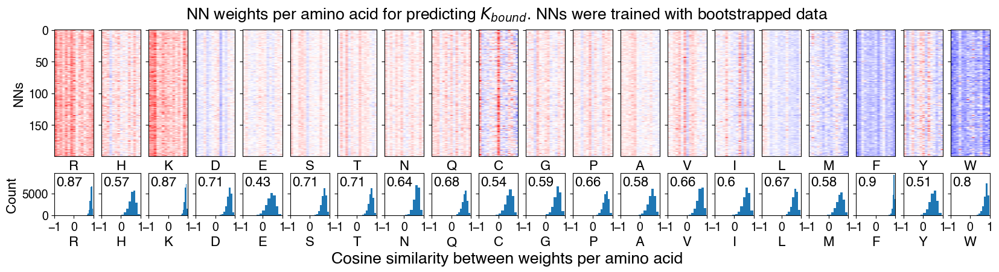

In [48]:
make_all_weight_heatmaps(15, model_results, bootstrap_results)

100%|██████████| 60/60 [00:00<00:00, 326.59it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
100%|██████████| 200/200 [00:00<00:00, 577.08it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


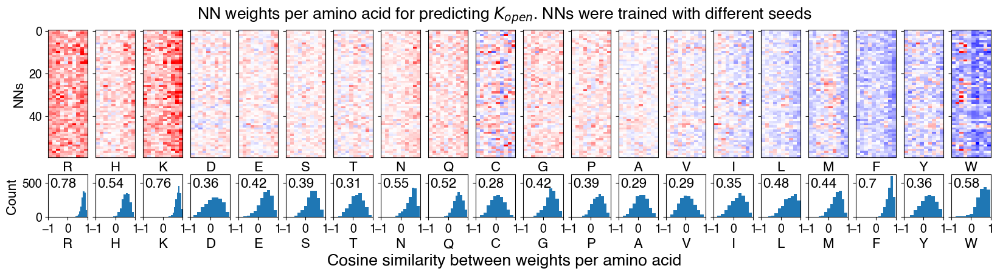

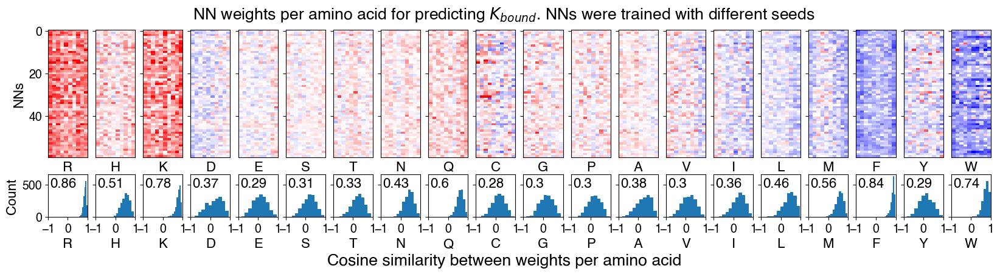

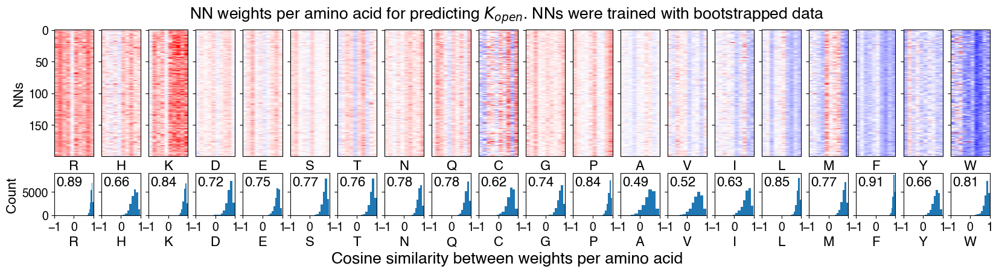

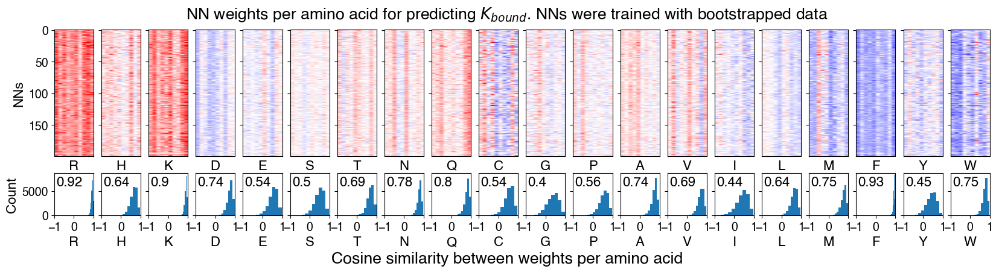

In [49]:
make_all_weight_heatmaps(10, model_results, bootstrap_results)

100%|██████████| 60/60 [00:00<00:00, 528.74it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
100%|██████████| 200/200 [00:00<00:00, 571.05it/s]
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp
1 extra bytes in post.stringData array
'created' timestamp seems very low; regarding as unix timestamp


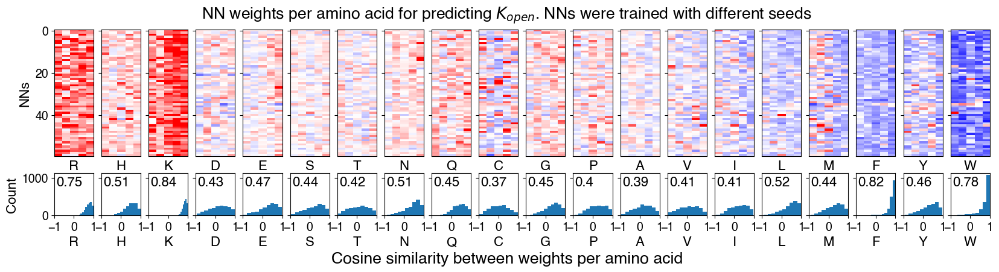

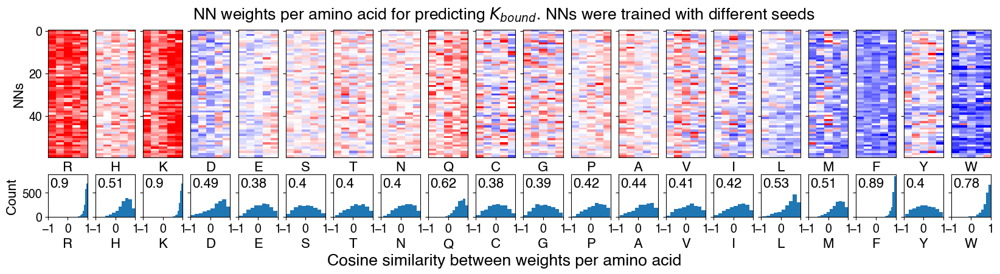

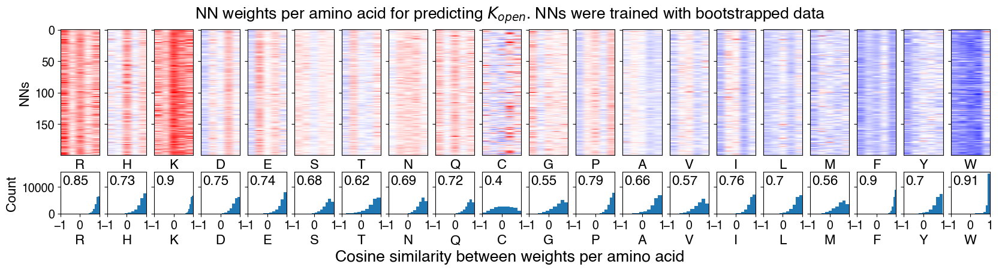

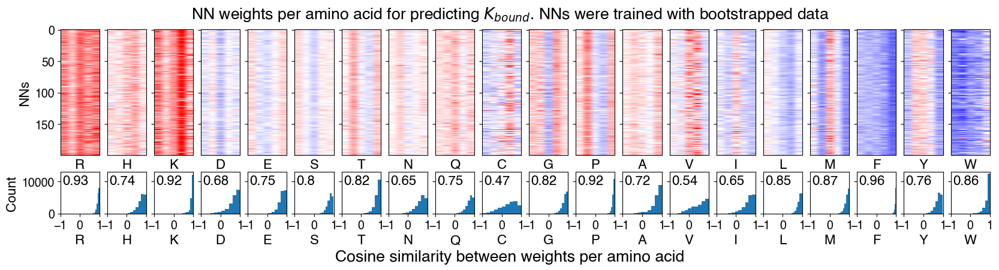

In [50]:
make_all_weight_heatmaps(5, model_results, bootstrap_results)